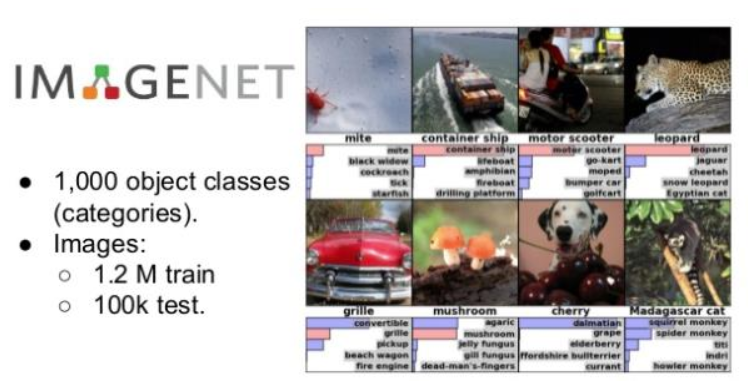

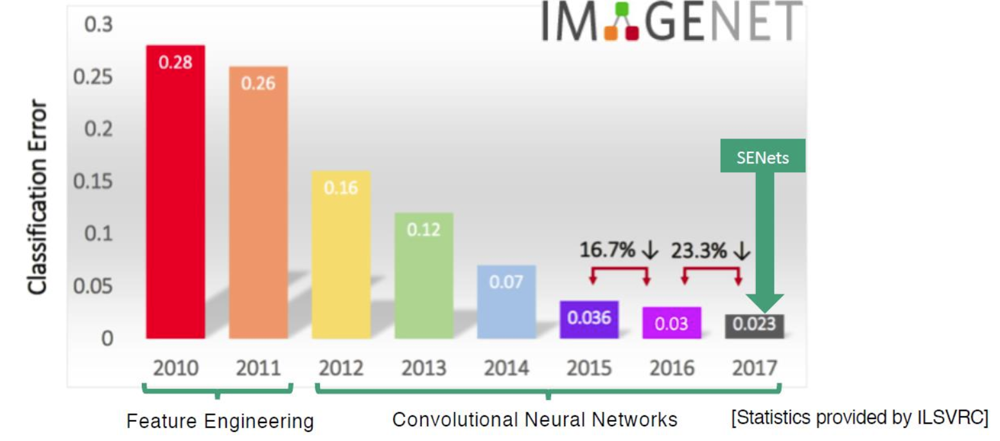

CVPR 
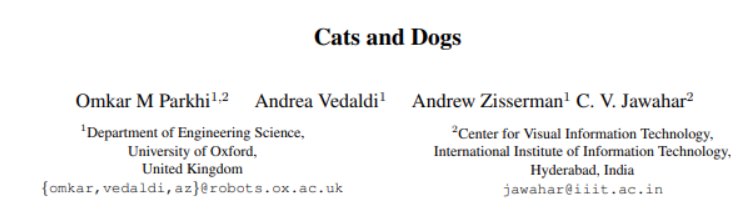

https://www.robots.ox.ac.uk/~vgg/publications/2012/parkhi12a/parkhi12a.pdf

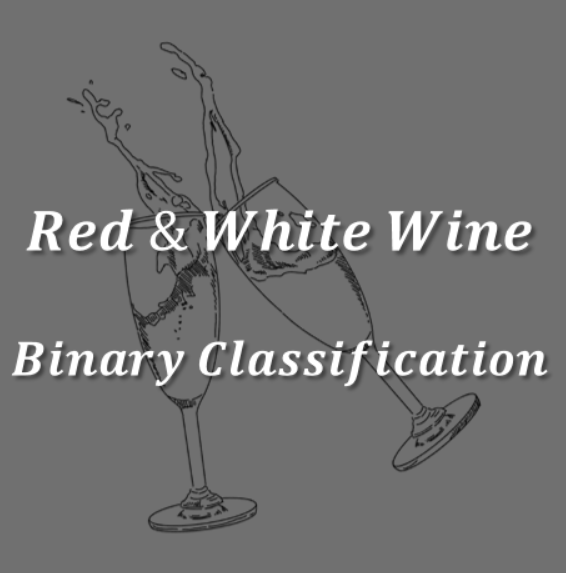

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf

In [ ]:
red   = pd.read_csv('/content/winequality-red.csv', sep = ';')
white = pd.read_csv('/content/winequality-white.csv', sep = ';')


display(red.head())
display(white.head())

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [ ]:
red['type']   = 0
white['type'] = 1

In [ ]:
display(red.head(3))
display(white.head(3))

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,0


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1


In [ ]:
wine = pd.concat([red, white])
display(wine.describe())

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378,0.753886
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255,0.430779
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000,0.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000,1.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000,1.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000,1.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000,1.000000


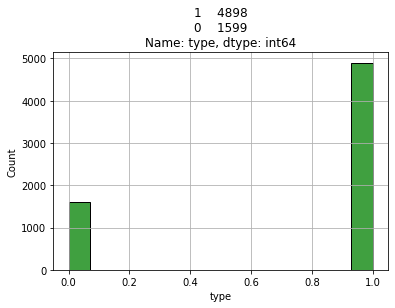

In [ ]:
sns.histplot(wine['type'], color = 'green')
plt.title('{}'.format(wine['type'].value_counts()))

plt.grid()
plt.show()

# 신경망이 화이트 와인(1)으로만 예측을 수행했다. -> 74% 
# 재현율 / 정밀도 / F1 score

In [ ]:
wine[:20]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,0
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,0
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,0
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5,0
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5,0
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7,0
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7,0
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5,0


In [ ]:
wine_shuffle = wine.sample(frac=1)
print(wine_shuffle.head())

      fixed acidity  volatile acidity  citric acid  ...  alcohol  quality  type
2045            8.7             0.240         0.35  ...     10.6        5     1
925             8.6             0.220         0.36  ...     11.0        7     0
244             6.9             0.400         0.56  ...      8.7        5     1
3608            7.0             0.160         0.25  ...      9.2        6     1
140             8.4             0.745         0.11  ...      9.6        5     0

[5 rows x 13 columns]


In [ ]:
wine_np = wine_shuffle.to_numpy()
print(type(wine_np))

<class 'numpy.ndarray'>


In [ ]:
train_ratio = 0.8

print("Total dataset index : ", len(wine_np))
train_idx = int(len(wine_np) * train_ratio)
print("Train Dataset index : ", train_idx)

Total dataset index :  6497
Train Dataset index :  5197


In [ ]:
train_X, train_Y = wine_np[  : train_idx , : -1 ], wine_np[ : train_idx, -1] 
test_X,  test_Y  = wine_np[  train_idx : , : -1 ], wine_np[ train_idx :, -1] 

In [ ]:
train_X, train_Y = wine_np[  : train_idx , : -1 ], wine_np[ : train_idx, -1 : ] 
test_X,  test_Y  = wine_np[  train_idx : , : -1 ], wine_np[ train_idx :, -1 : ] 

In [ ]:
print(train_X.shape)
print(train_Y.shape)
print(test_X.shape)
print(test_Y.shape)

(5197, 12)
(5197, 1)
(1300, 12)
(1300, 1)


In [ ]:
train_X[0]

array([9.100e+00, 4.700e-01, 4.900e-01, 2.600e+00, 9.400e-02, 3.800e+01,
       1.060e+02, 9.982e-01, 3.080e+00, 5.900e-01, 9.100e+00, 5.000e+00])

In [ ]:
print(train_Y[0])
print(train_Y[1])
print(train_Y[2])

[0.]
[1.]
[1.]


In [ ]:
print("\nBefore - to_categorical : \n")
print(train_Y[0])
print(train_Y[1])
print(train_Y[2])

train_Y_to_categorical = tf.keras.utils.to_categorical(train_Y, num_classes = 2 )
test_Y_to_categorical  = tf.keras.utils.to_categorical(test_Y,  num_classes = 2 )

#train_Y_to_categorical_5 = tf.keras.utils.to_categorical(train_Y, num_classes = 5 )


print("\nAfter - to_categorical : \n")
print(train_Y_to_categorical[0])
print(train_Y_to_categorical[1])
print(train_Y_to_categorical[2])

print("\nAfter - to_categorical_5 : \n")
print(train_Y_to_categorical_5[:3])


Before - to_categorical : 

0.0
1.0
1.0

After - to_categorical : 

[1. 0.]
[0. 1.]
[0. 1.]

After - to_categorical_5 : 

[[1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]]


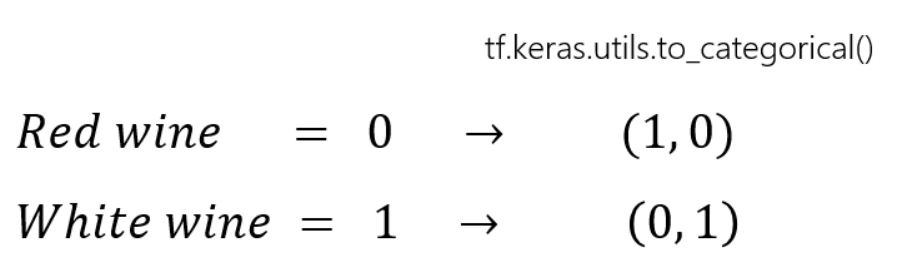

In [ ]:
print(train_Y_to_categorical.shape)
print(test_Y_to_categorical.shape)

(5197, 2)
(1300, 2)


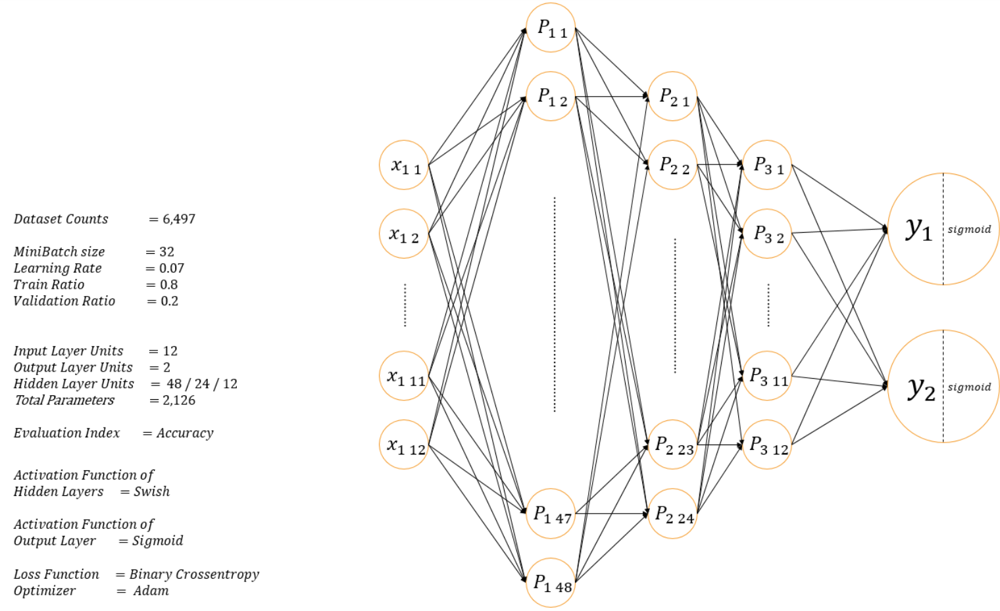

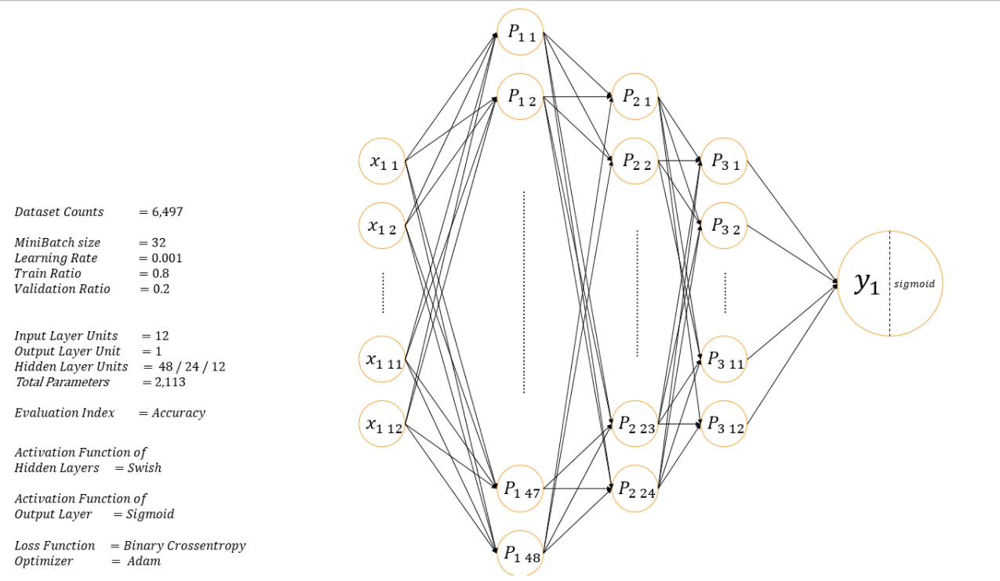

In [ ]:
model_swish_sigmoid = tf.keras.Sequential([
                                           tf.keras.layers.Dense(units=48, activation='swish', input_shape = (12,)),
                                           tf.keras.layers.Dense(units=24, activation='swish'),
                                           tf.keras.layers.Dense(units=12, activation='swish'),
                                           tf.keras.layers.Dense(units=2 , activation='sigmoid')
])

In [ ]:
model_swish_sigmoid_no_onehot = tf.keras.Sequential([
                                           tf.keras.layers.Dense(units=48, activation='swish', input_shape = (12,)),
                                           tf.keras.layers.Dense(units=24, activation='swish'),
                                           tf.keras.layers.Dense(units=12, activation='swish'),
                                           tf.keras.layers.Dense(units=1 , activation='sigmoid')
])

In [ ]:
model_swish_sigmoid.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.07),
                            loss = 'binary_crossentropy',
                            metrics = ['accuracy'])

In [ ]:
model_swish_sigmoid_no_onehot.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                                     loss = 'binary_crossentropy',
                                     metrics = ['accuracy'])

In [ ]:
model_swish_sigmoid.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 48)                624       
_________________________________________________________________
dense_1 (Dense)              (None, 24)                1176      
_________________________________________________________________
dense_2 (Dense)              (None, 12)                300       
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 26        
Total params: 2,126
Trainable params: 2,126
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_swish_sigmoid_no_onehot.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 48)                624       
_________________________________________________________________
dense_5 (Dense)              (None, 24)                1176      
_________________________________________________________________
dense_6 (Dense)              (None, 12)                300       
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 13        
Total params: 2,113
Trainable params: 2,113
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = model_swish_sigmoid.fit(train_X, train_Y_to_categorical, 
                                  epochs = 25, batch_size = 36, validation_split = 0.2,
                                  callbacks = [tf.keras.callbacks.EarlyStopping(patience = 3,
                                                                                monitor='val_loss')])

In [ ]:
history_1 = model_swish_sigmoid_no_onehot.fit(train_X, train_Y, 
                                              epochs = 25, batch_size = 24, validation_split = 0.2,
                                              callbacks = [tf.keras.callbacks.EarlyStopping(patience = 3,
                                                                                            monitor='val_loss')])

Epoch 1/25
174/174 [==============================] - 1s 3ms/step - loss: 0.2501 - accuracy: 0.9110 - val_loss: 0.1669 - val_accuracy: 0.9481
Epoch 2/25
174/174 [==============================] - 0s 2ms/step - loss: 0.1851 - accuracy: 0.9370 - val_loss: 0.1463 - val_accuracy: 0.9500
Epoch 3/25
174/174 [==============================] - 0s 2ms/step - loss: 0.1685 - accuracy: 0.9394 - val_loss: 0.1261 - val_accuracy: 0.9606
Epoch 4/25
174/174 [==============================] - 0s 2ms/step - loss: 0.1475 - accuracy: 0.9464 - val_loss: 0.1368 - val_accuracy: 0.9538
Epoch 5/25
174/174 [==============================] - 0s 2ms/step - loss: 0.1391 - accuracy: 0.9519 - val_loss: 0.1248 - val_accuracy: 0.9471
Epoch 6/25
174/174 [==============================] - 0s 2ms/step - loss: 0.1275 - accuracy: 0.9545 - val_loss: 0.0987 - val_accuracy: 0.9683
Epoch 7/25
174/174 [==============================] - 0s 2ms/step - loss: 0.1278 - accuracy: 0.9574 - val_loss: 0.0934 - val_accuracy: 0.9644
Epoch 

In [ ]:
model_swish_sigmoid.evaluate(test_X,test_Y_to_categorical)

41/41 [==============================] - 0s 1ms/step - loss: 0.1674 - accuracy: 0.9462


[0.16737718880176544, 0.9461538195610046]

In [ ]:
model_swish_sigmoid_no_onehot.evaluate(test_X,test_Y)

41/41 [==============================] - 0s 995us/step - loss: 0.1108 - accuracy: 0.9615


[0.11079608649015427, 0.9615384340286255]

In [ ]:
pred_Y = model_swish_sigmoid.predict(test_X)
print(np.round(pred_Y[:20],2))

[[0.92 0.09]
 [0.02 0.95]
 [0.03 0.94]
 [0.01 0.99]
 [0.92 0.09]
 [0.92 0.09]
 [0.   0.99]
 [0.   0.99]
 [0.92 0.09]
 [0.92 0.09]
 [0.92 0.09]
 [0.92 0.1 ]
 [0.   1.  ]
 [0.   0.99]
 [0.   1.  ]
 [0.92 0.09]
 [0.09 0.86]
 [0.92 0.09]
 [0.   1.  ]
 [0.09 0.87]]


In [ ]:
pred_Y = model_swish_sigmoid_no_onehot.predict(test_X)
print(np.round(pred_Y[:20],2))

[[0.02]
 [0.96]
 [0.91]
 [0.99]
 [0.  ]
 [0.  ]
 [0.99]
 [1.  ]
 [0.02]
 [0.  ]
 [0.  ]
 [0.35]
 [1.  ]
 [0.99]
 [1.  ]
 [0.  ]
 [0.98]
 [0.  ]
 [1.  ]
 [0.97]]


In [ ]:
print(np.round(pred_Y[:20]))

[[0.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [1.]
 [1.]
 [0.]
 [0.]
 [0.]
 [0.]
 [1.]
 [1.]
 [1.]
 [0.]
 [1.]
 [0.]
 [1.]
 [1.]]


In [ ]:
test_Y[:20]

array([[0.],
       [1.],
       [1.],
       [1.],
       [0.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [1.],
       [0.],
       [1.],
       [1.]])

In [ ]:
print(np.round(pred_Y[:20]))

[[1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]]


# MSE
# 예측값 0.13  |  0.87
# 실제값 1.00  |  0.00
#  MSE - 1  |  0

In [ ]:
test_Y[:20]

array([0., 1., 1., 1., 0., 0., 1., 1., 0., 0., 0., 1., 1., 1., 1., 0., 1.,
       0., 1., 1.])

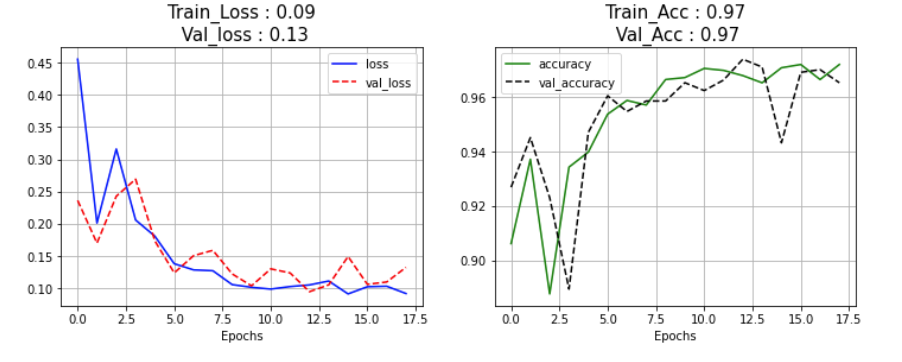

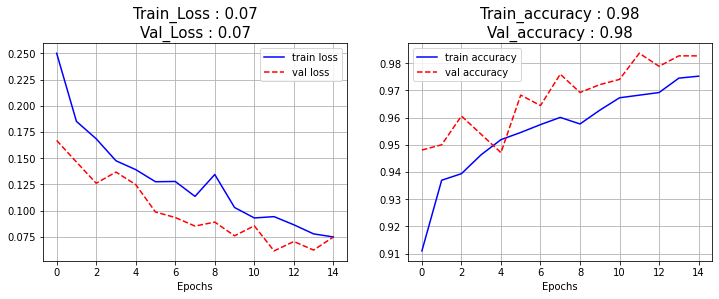

In [ ]:
val_accuracy = history_1.history['val_accuracy']
accuracy = history_1.history['accuracy']

val_loss = history_1.history['val_loss']
loss = history_1.history['loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)

plt.plot(history_1.history['loss'], 'b-', label = 'train loss')
plt.plot(history_1.history['val_loss'], 'r--', label = 'val loss')
plt.xlabel('Epochs')

plt.title("Train_Loss : {:.2f}\nVal_Loss : {:.2f}".\
          format(loss[-1], val_loss[-1]), fontsize = 15)

plt.legend()
plt.grid()

plt.subplot(1, 2, 2)

plt.plot(history_1.history['accuracy'], 'b-', label = 'train accuracy')
plt.plot(history_1.history['val_accuracy'], 'r--', label = 'val accuracy')
plt.xlabel('Epochs')

plt.title("Train_accuracy : {:.2f}\nVal_accuracy : {:.2f}".\
          format(accuracy[-1], val_accuracy[-1]), fontsize = 15)

plt.legend()
plt.grid()

plt.show()

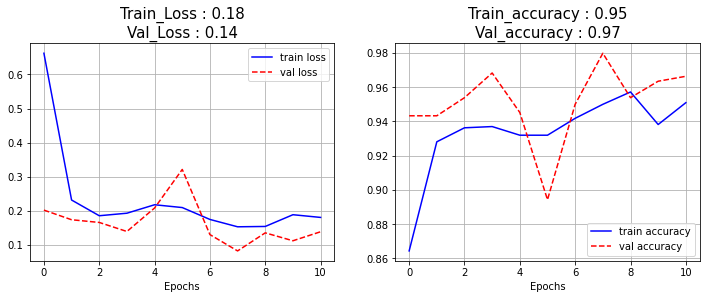

In [ ]:
val_accuracy = history.history['val_accuracy']
accuracy = history.history['accuracy']

val_loss = history.history['val_loss']
loss = history.history['loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)

plt.plot(history.history['loss'], 'b-', label = 'train loss')
plt.plot(history.history['val_loss'], 'r--', label = 'val loss')
plt.xlabel('Epochs')

plt.title("Train_Loss : {:.2f}\nVal_Loss : {:.2f}".\
          format(loss[-1], val_loss[-1]), fontsize = 15)

plt.legend()
plt.grid()

plt.subplot(1, 2, 2)

plt.plot(history.history['accuracy'], 'b-', label = 'train accuracy')
plt.plot(history.history['val_accuracy'], 'r--', label = 'val accuracy')
plt.xlabel('Epochs')

plt.title("Train_accuracy : {:.2f}\nVal_accuracy : {:.2f}".\
          format(accuracy[-1], val_accuracy[-1]), fontsize = 15)

plt.legend()
plt.grid()

plt.show()

In [ ]:
val_accuracy

[0.9432692527770996,
 0.9432692527770996,
 0.9538461565971375,
 0.9682692289352417,
 0.9451923370361328,
 0.8942307829856873,
 0.949999988079071,
 0.9798076748847961,
 0.9538461565971375,
 0.9634615182876587,
 0.9663461446762085]

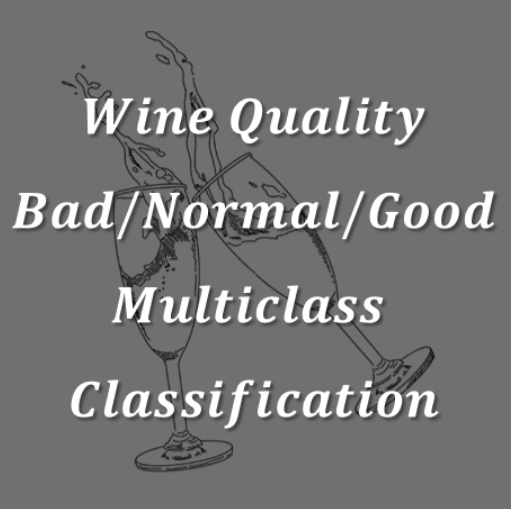

In [ ]:
wine

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,1
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,1


In [ ]:
print(wine['quality'].value_counts())

6    2836
5    2138
7    1079
4     216
8     193
3      30
9       5
Name: quality, dtype: int64


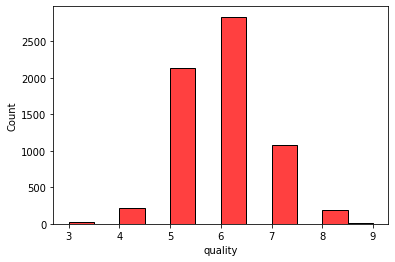

In [ ]:
sns.histplot(wine['quality'], color = 'red', binwidth=0.5)
plt.show()

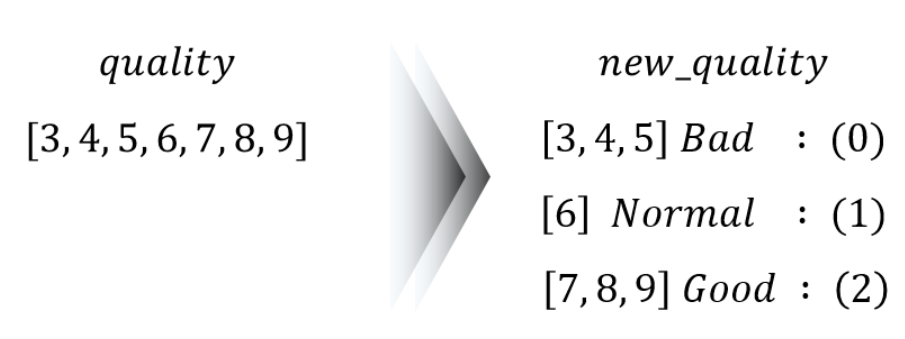

In [ ]:
wine.loc[wine['quality']  <= 5, 'new_quality'] = 0
wine.loc[wine['quality']  == 6, 'new_quality'] = 1
wine.loc[wine['quality']  >= 7, 'new_quality'] = 2

In [ ]:
print(wine['new_quality'].value_counts())

1.0    2836
0.0    2384
2.0    1277
Name: new_quality, dtype: int64


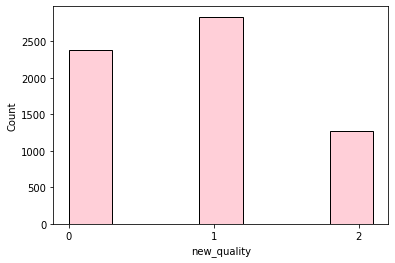

In [ ]:
sns.histplot(wine['new_quality'], binwidth=0.3, color = 'pink')
plt.xticks(ticks=[0,2,1])
plt.show()

In [ ]:
wine

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type,new_quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0,0.0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,0,0.0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,0,0.0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,0,1.0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1,1.0
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,1,0.0
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1,1.0
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,1,2.0


In [ ]:
del wine['quality']
display(wine)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,type,new_quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0,0.0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,0,0.0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,0,0.0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,0,1.0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1,1.0
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,1,0.0
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,1,1.0
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1,2.0


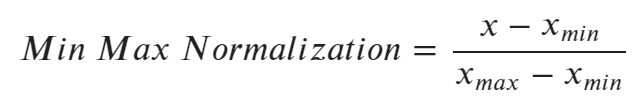

In [ ]:
wine_norm = (wine - wine.min()) / (wine.max() - wine.min())
wine_norm

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,type,new_quality
0,0.297521,0.413333,0.000000,0.019939,0.111296,0.034722,0.064516,0.206092,0.612403,0.191011,0.202899,0.0,0.0
1,0.330579,0.533333,0.000000,0.030675,0.147841,0.083333,0.140553,0.186813,0.372093,0.258427,0.260870,0.0,0.0
2,0.330579,0.453333,0.024096,0.026074,0.137874,0.048611,0.110599,0.190669,0.418605,0.241573,0.260870,0.0,0.0
3,0.611570,0.133333,0.337349,0.019939,0.109635,0.055556,0.124424,0.209948,0.341085,0.202247,0.260870,0.0,0.5
4,0.297521,0.413333,0.000000,0.019939,0.111296,0.034722,0.064516,0.206092,0.612403,0.191011,0.202899,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,0.198347,0.086667,0.174699,0.015337,0.049834,0.079861,0.198157,0.077694,0.426357,0.157303,0.463768,1.0,0.5
4894,0.231405,0.160000,0.216867,0.113497,0.063123,0.194444,0.373272,0.150183,0.333333,0.134831,0.231884,1.0,0.0
4895,0.223140,0.106667,0.114458,0.009202,0.053156,0.100694,0.241935,0.104685,0.209302,0.134831,0.202899,1.0,0.5
4896,0.140496,0.140000,0.180723,0.007669,0.021595,0.065972,0.239631,0.030461,0.480620,0.089888,0.695652,1.0,1.0


In [ ]:
print(wine['new_quality'][:10])
print(wine_norm['new_quality'][:10])

0    0.0
1    0.0
2    0.0
3    1.0
4    0.0
5    0.0
6    0.0
7    2.0
8    2.0
9    0.0
Name: new_quality, dtype: float64
0    0.0
1    0.0
2    0.0
3    0.5
4    0.0
5    0.0
6    0.0
7    1.0
8    1.0
9    0.0
Name: new_quality, dtype: float64


In [ ]:
wine_shuffle = wine_norm.sample(frac=1)
wine_np      = wine_shuffle.to_numpy()

In [ ]:
train_ratio = 0.8 

train_idx = int(len(wine_np) * train_ratio )
print("train_idx : ", train_idx)

train_idx :  5197


In [ ]:
train_X, train_Y =  wine_np[   : train_idx   , : -1  ], wine_np[    : train_idx,  -1 : ]
test_X, test_Y   =  wine_np[   train_idx :   , : -1  ], wine_np[    train_idx :,  -1 : ]

In [ ]:
print(train_X.shape)
print(train_Y.shape)
print(test_X.shape)
print(test_Y.shape)

(5197, 12)
(5197, 1)
(1300, 12)
(1300, 1)


In [ ]:
train_Y_to_categorical = tf.keras.utils.to_categorical(train_Y, num_classes = 3)
test_Y_to_categorical  = tf.keras.utils.to_categorical(test_Y, num_classes  = 3)

print(train_X.shape)
print(train_Y_to_categorical.shape)
print(test_X.shape)
print(test_Y_to_categorical.shape)

(5197, 12)
(5197, 3)
(1300, 12)
(1300, 3)


In [ ]:
train_Y_to_categorical[:5]

array([[1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       [1., 0., 0.]], dtype=float32)

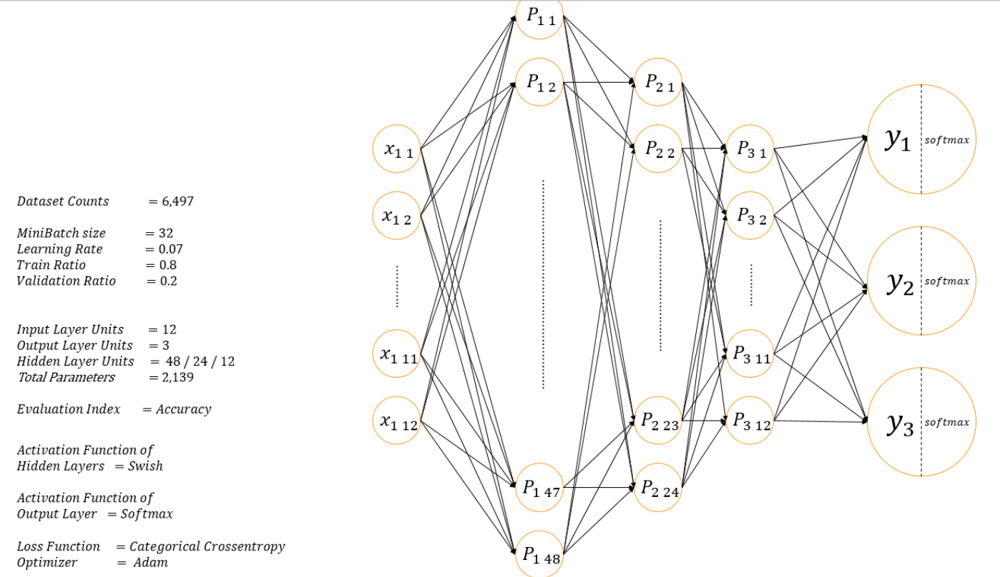

In [ ]:
model_swish_softmax = tf.keras.Sequential([
                                           tf.keras.layers.Dense(units=48, activation='swish', input_shape=(12,)),
                                           tf.keras.layers.Dense(units=24, activation='swish'),
                                           tf.keras.layers.Dense(units=12, activation='swish'),
                                           tf.keras.layers.Dense(units=3 , activation='softmax'),
])

In [ ]:
model_swish_softmax.compile(optimizer=tf.keras.optimizers.Adam(),
                            loss = 'categorical_crossentropy',
                            metrics = ['accuracy'])

In [ ]:
history = model_swish_softmax.fit(train_X, train_Y_to_categorical,
                                  epochs = 200, batch_size = 32,
                                  validation_split = 0.2,
                                  callbacks = [tf.keras.callbacks.EarlyStopping(patience=3)])

Epoch 1/200
130/130 [==============================] - 1s 4ms/step - loss: 0.6943 - accuracy: 0.7710 - val_loss: 0.4819 - val_accuracy: 0.8087
Epoch 2/200
130/130 [==============================] - 0s 2ms/step - loss: 0.4580 - accuracy: 0.8025 - val_loss: 0.4108 - val_accuracy: 0.8125
Epoch 3/200
130/130 [==============================] - 0s 2ms/step - loss: 0.4273 - accuracy: 0.8051 - val_loss: 0.3959 - val_accuracy: 0.8192
Epoch 4/200
130/130 [==============================] - 0s 2ms/step - loss: 0.4166 - accuracy: 0.8157 - val_loss: 0.3891 - val_accuracy: 0.8192
Epoch 5/200
130/130 [==============================] - 0s 2ms/step - loss: 0.4084 - accuracy: 0.8136 - val_loss: 0.3830 - val_accuracy: 0.8288
Epoch 6/200
130/130 [==============================] - 0s 2ms/step - loss: 0.4066 - accuracy: 0.8124 - val_loss: 0.3827 - val_accuracy: 0.8288
Epoch 7/200
130/130 [==============================] - 0s 2ms/step - loss: 0.4047 - accuracy: 0.8128 - val_loss: 0.3838 - val_accuracy: 0.8298

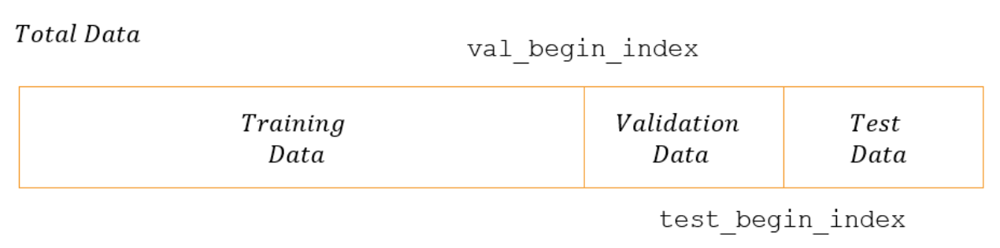

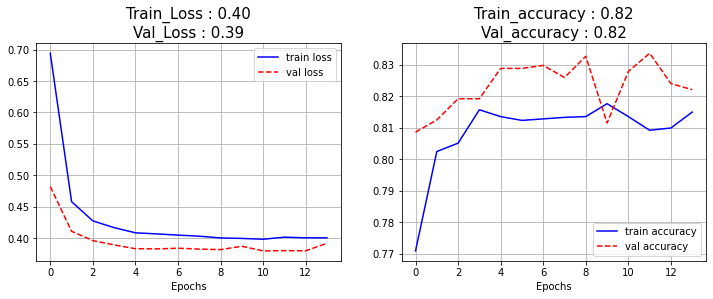

In [ ]:
val_accuracy = history.history['val_accuracy']
accuracy = history.history['accuracy']

val_loss = history.history['val_loss']
loss = history.history['loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)

plt.plot(history.history['loss'], 'b-', label = 'train loss')
plt.plot(history.history['val_loss'], 'r--', label = 'val loss')
plt.xlabel('Epochs')

plt.title("Train_Loss : {:.2f}\nVal_Loss : {:.2f}".\
          format(loss[-1], val_loss[-1]), fontsize = 15)

plt.legend()
plt.grid()

plt.subplot(1, 2, 2)

plt.plot(history.history['accuracy'], 'b-', label = 'train accuracy')
plt.plot(history.history['val_accuracy'], 'r--', label = 'val accuracy')
plt.xlabel('Epochs')

plt.title("Train_accuracy : {:.2f}\nVal_accuracy : {:.2f}".\
          format(accuracy[-1], val_accuracy[-1]), fontsize = 15)

plt.legend()
plt.grid()

plt.show()

In [ ]:
pred_Y = model_swish_softmax.predict(test_X)
print(pred_Y[10:20])

pred_Y_round = np.round(pred_Y,2)
print(pred_Y_round[10:20])

pred_Y_round = np.round(pred_Y)
print(pred_Y_round[10:20])


pred_Y_argmax = np.argmax(pred_Y_round, axis = 1)
print(pred_Y_argmax[10:20])

test_Y_argmax = np.argmax(test_Y_to_categorical,axis = 1)
print(test_Y_argmax[10:20])

[[5.9994334e-01 3.9999795e-01 5.8708494e-05]
 [6.5490133e-01 3.4500197e-01 9.6765427e-05]
 [6.6990769e-01 3.2997832e-01 1.1400110e-04]
 [9.7759295e-01 2.2374690e-02 3.2291682e-05]
 [9.5992368e-01 4.0040173e-02 3.6192898e-05]
 [8.7436664e-01 1.2557501e-01 5.8352896e-05]
 [9.7599936e-01 2.3978030e-02 2.2593145e-05]
 [5.8846444e-01 4.1092604e-01 6.0949905e-04]
 [9.7748238e-01 2.2485824e-02 3.1791395e-05]
 [9.3198919e-01 6.7943111e-02 6.7720743e-05]]
[[0.6  0.4  0.  ]
 [0.65 0.35 0.  ]
 [0.67 0.33 0.  ]
 [0.98 0.02 0.  ]
 [0.96 0.04 0.  ]
 [0.87 0.13 0.  ]
 [0.98 0.02 0.  ]
 [0.59 0.41 0.  ]
 [0.98 0.02 0.  ]
 [0.93 0.07 0.  ]]
[[1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]]
[0 0 0 0 0 0 0 0 0 0]
[1 0 0 0 0 0 0 1 0 0]


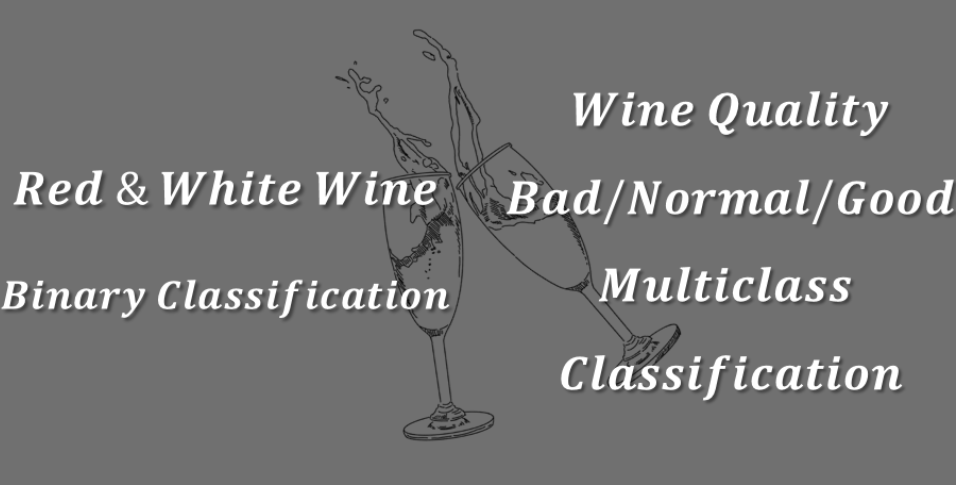

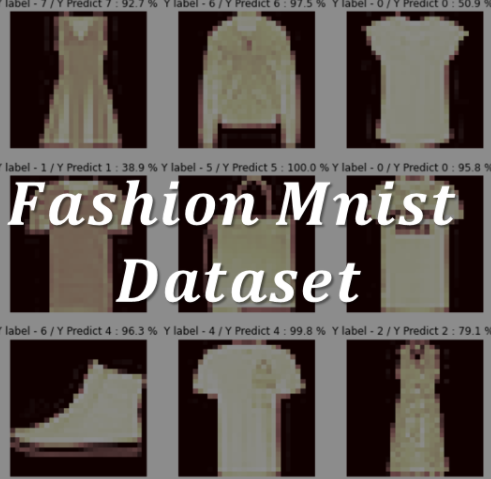

In [ ]:
fashion_mnist = tf.keras.datasets.fashion_mnist
(train_X, train_Y), (test_X, test_Y) = fashion_mnist.load_data()

4423680/4422102 [==============================] - 0s 0us/step


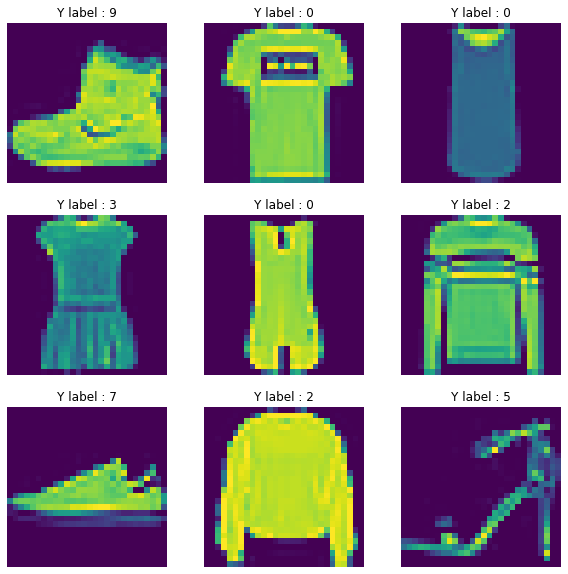

In [ ]:
plt.figure(figsize=(10,10))

for i in range(9):
    plt.subplot(3,3,i + 1)
    plt.title('Y label : {}'.format(train_Y[i]))
    plt.axis('off')
    plt.imshow(train_X[i])

plt.show()

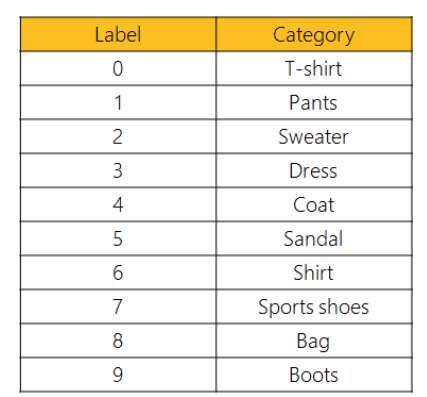

In [ ]:
print("train_X[0].shape : ", train_X[0].shape)
print("train_X[0].ndim : ", train_X[0].ndim)

train_X[0].shape :  (28, 28)
train_X[0].ndim :  2


In [ ]:
print("train_X.shape : ", train_X.shape)
print("train_X.ndim : ", train_X.ndim)

train_X.shape :  (60000, 28, 28)
train_X.ndim :  3


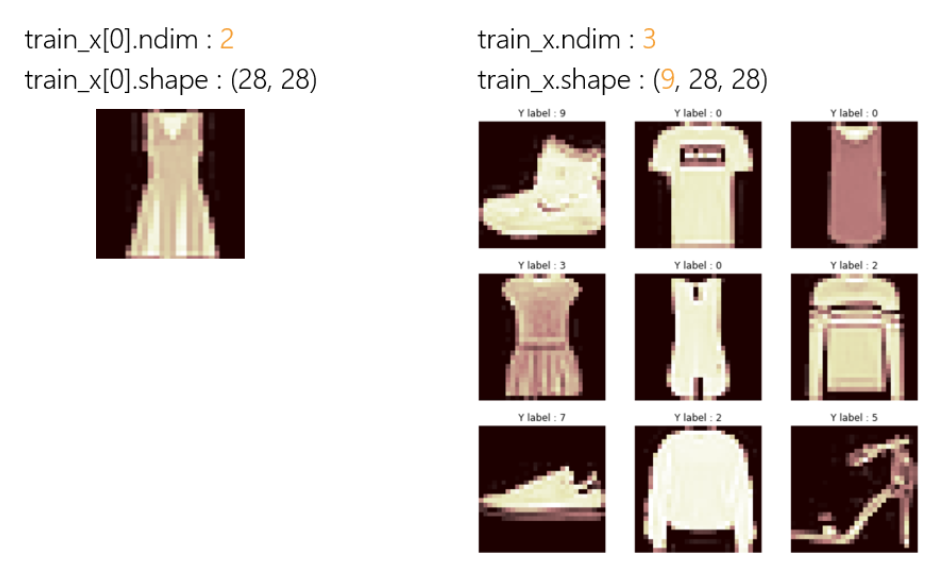

In [ ]:
print(np.min(train_X))
print(np.max(train_X))

0
255


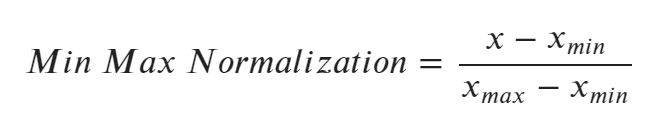

In [ ]:
train_X_norm = train_X / 255.0
print(np.min(train_X_norm))
print(np.max(train_X_norm))

test_X_norm = test_X / 255.0

0.0
1.0


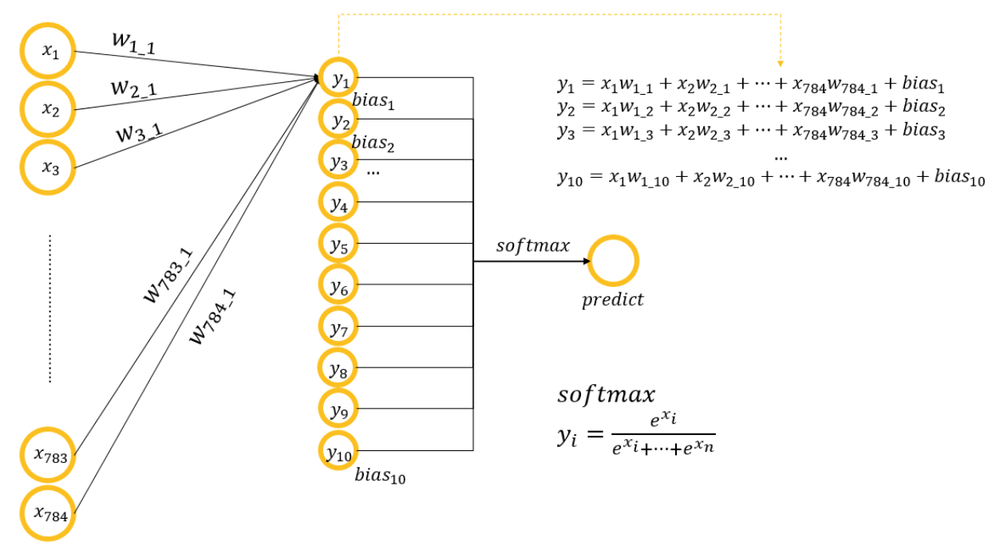

In [ ]:
Fmnist_Relu_DNN = tf.keras.Sequential([
                                       tf.keras.layers.Flatten(input_shape = (28,28)),
                                       tf.keras.layers.Dense(units=128, activation='relu'),
                                       tf.keras.layers.Dense(units=64, activation='relu'),
                                       tf.keras.layers.Dense(units=32, activation='relu'),
                                       tf.keras.layers.Dense(units=10, activation='softmax')
])

In [ ]:
Fmnist_Relu_DNN.compile(optimizer=tf.keras.optimizers.Adam(),
                        loss = 'sparse_categorical_crossentropy',
                        metrics = ['accuracy'])

In [ ]:
Fmnist_Relu_DNN.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 128)               100480    
_________________________________________________________________
dense_5 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_6 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_7 (Dense)              (None, 10)                330       
Total params: 111,146
Trainable params: 111,146
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = Fmnist_Relu_DNN.fit(train_X_norm, train_Y,
                              epochs = 200, batch_size = 32,
                              validation_split = 0.2,
                              callbacks = [tf.keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/200
1500/1500 [==============================] - 5s 3ms/step - loss: 0.5248 - accuracy: 0.8123 - val_loss: 0.4503 - val_accuracy: 0.8265
Epoch 2/200
1500/1500 [==============================] - 4s 3ms/step - loss: 0.3859 - accuracy: 0.8581 - val_loss: 0.3985 - val_accuracy: 0.8545
Epoch 3/200
1500/1500 [==============================] - 4s 3ms/step - loss: 0.3483 - accuracy: 0.8714 - val_loss: 0.3725 - val_accuracy: 0.8640
Epoch 4/200
1500/1500 [==============================] - 4s 3ms/step - loss: 0.3238 - accuracy: 0.8798 - val_loss: 0.3610 - val_accuracy: 0.8716
Epoch 5/200
1500/1500 [==============================] - 4s 3ms/step - loss: 0.3033 - accuracy: 0.8873 - val_loss: 0.3366 - val_accuracy: 0.8809
Epoch 6/200
1500/1500 [==============================] - 4s 3ms/step - loss: 0.2877 - accuracy: 0.8916 - val_loss: 0.3391 - val_accuracy: 0.8813
Epoch 7/200
1500/1500 [==============================] - 4s 3ms/step - loss: 0.2754 - accuracy: 0.8971 - val_loss: 0.3232 - val_ac

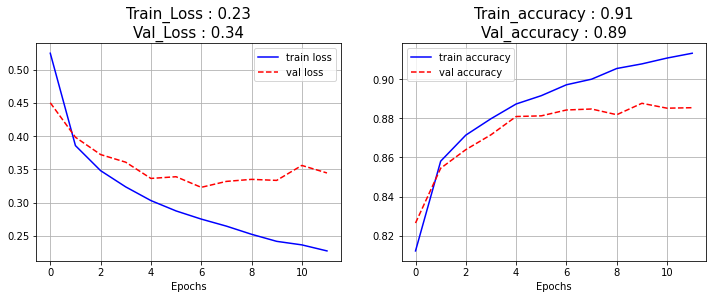

In [ ]:
val_accuracy = history.history['val_accuracy']
accuracy = history.history['accuracy']

val_loss = history.history['val_loss']
loss = history.history['loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)

plt.plot(history.history['loss'], 'b-', label = 'train loss')
plt.plot(history.history['val_loss'], 'r--', label = 'val loss')
plt.xlabel('Epochs')

plt.title("Train_Loss : {:.2f}\nVal_Loss : {:.2f}".\
          format(loss[-1], val_loss[-1]), fontsize = 15)

plt.legend()
plt.grid()

plt.subplot(1, 2, 2)

plt.plot(history.history['accuracy'], 'b-', label = 'train accuracy')
plt.plot(history.history['val_accuracy'], 'r--', label = 'val accuracy')
plt.xlabel('Epochs')

plt.title("Train_accuracy : {:.2f}\nVal_accuracy : {:.2f}".\
          format(accuracy[-1], val_accuracy[-1]), fontsize = 15)

plt.legend()
plt.grid()

plt.show()

In [ ]:
pred_Y = Fmnist_Relu_DNN.predict(test_X_norm)
print(pred_Y[:5])

[[3.75803552e-07 1.68774955e-06 1.14224185e-05 1.46749505e-06
  9.52080609e-06 8.00025649e-04 4.09337008e-05 2.74562687e-02
  1.99609076e-07 9.71678138e-01]
 [1.09483360e-03 7.39621420e-11 9.83165145e-01 4.89717138e-07
  1.43466918e-02 7.35062011e-11 1.39281584e-03 3.71182596e-16
  1.15678427e-08 4.30266174e-14]
 [1.05663709e-07 9.99999166e-01 8.31472391e-11 6.73824900e-07
  1.06828097e-11 7.81073826e-22 1.90039734e-10 6.84122795e-26
  2.35850905e-11 5.63353889e-19]
 [1.23842233e-06 9.99850154e-01 2.99356273e-09 1.48566760e-04
  4.50117899e-09 3.80982149e-19 1.59015201e-08 1.58437349e-22
  8.70610428e-09 1.49132310e-17]
 [6.46614134e-02 1.09450617e-07 2.41208100e-03 7.00573553e-04
  3.45201930e-03 2.32186412e-08 9.28764045e-01 4.03031279e-08
  9.70692054e-06 4.79689000e-08]]


In [ ]:
pred_Y_round = np.round(pred_Y,3)
print(pred_Y_round[:5])

[[0.    0.    0.    0.    0.    0.001 0.    0.027 0.    0.972]
 [0.001 0.    0.983 0.    0.014 0.    0.001 0.    0.    0.   ]
 [0.    1.    0.    0.    0.    0.    0.    0.    0.    0.   ]
 [0.    1.    0.    0.    0.    0.    0.    0.    0.    0.   ]
 [0.065 0.    0.002 0.001 0.003 0.    0.929 0.    0.    0.   ]]


In [ ]:
pred_Y_argmax = np.argmax(pred_Y_round, axis = 1)
print(pred_Y_argmax[:5])

[9 2 1 1 6]


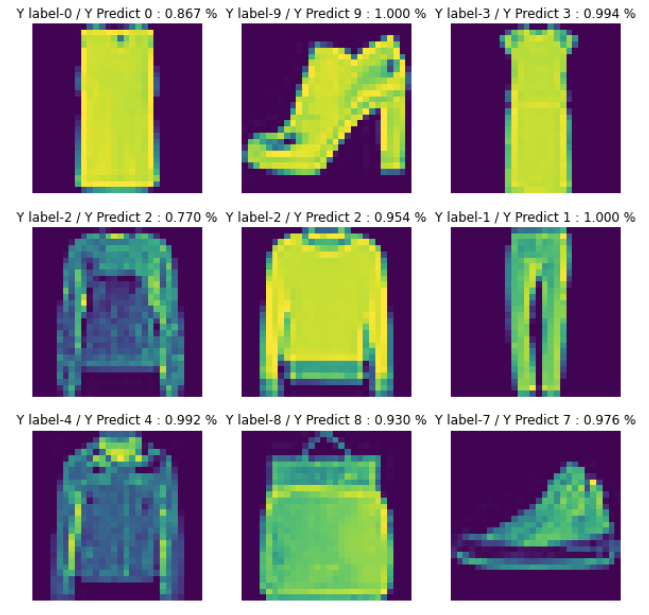

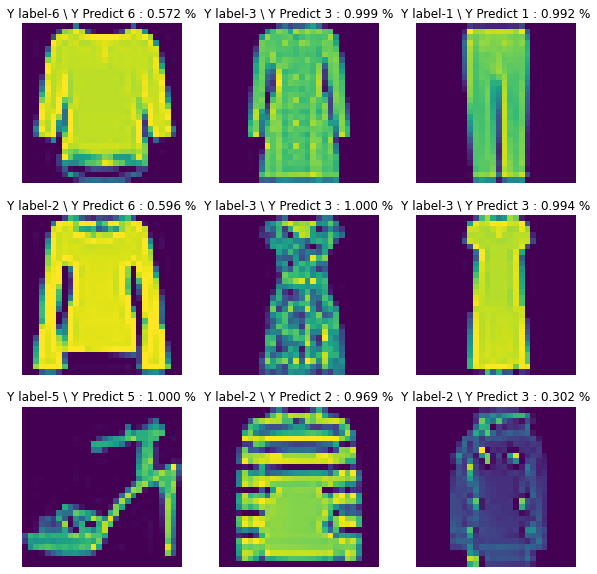

In [ ]:
plt.figure(figsize=(10,10))

for i in range(9):
    plt.subplot(3,3,i+1)

    i = np.random.choice(range(0,10000))
    
    plt.title("Y label-{} \ Y Predict {} : {:.3f} %".\
              format(test_Y[i], pred_Y_argmax[i],np.max(pred_Y_round[:][i])))
    plt.axis('off')
    plt.imshow(test_X[i])

plt.show()

In [ ]:
print(pred_Y_round[:])
print("======================")
print(pred_Y_round[:][1])
print("======================")
print(np.max(pred_Y_round[:][1]))

[[0.    0.    0.    ... 0.027 0.    0.972]
 [0.001 0.    0.983 ... 0.    0.    0.   ]
 [0.    1.    0.    ... 0.    0.    0.   ]
 ...
 [0.127 0.    0.003 ... 0.    0.86  0.   ]
 [0.    1.    0.    ... 0.    0.    0.   ]
 [0.    0.    0.    ... 0.    0.    0.   ]]
[0.001 0.    0.983 0.    0.014 0.    0.001 0.    0.    0.   ]
0.983


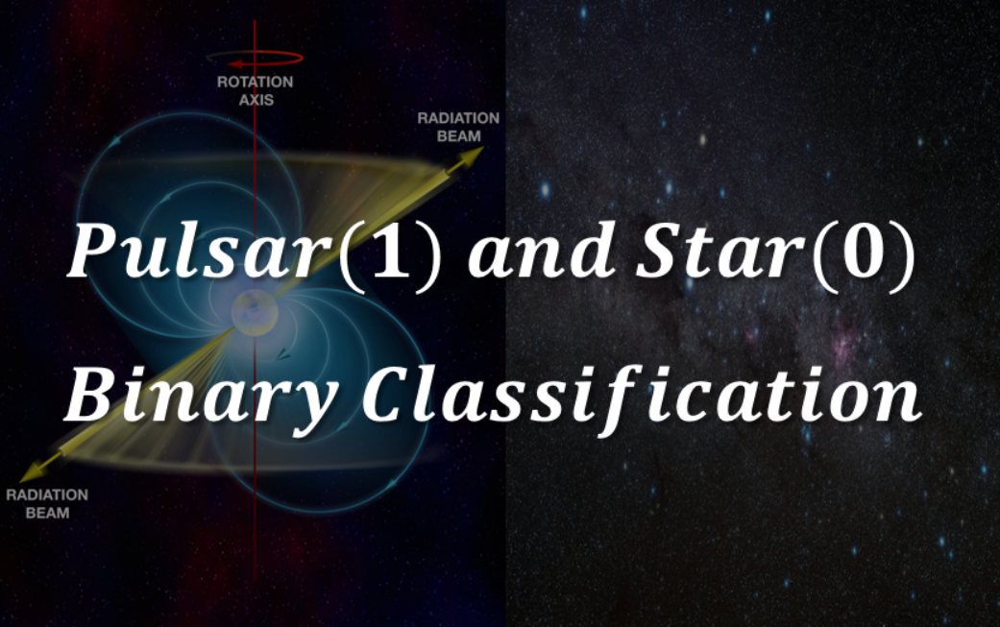

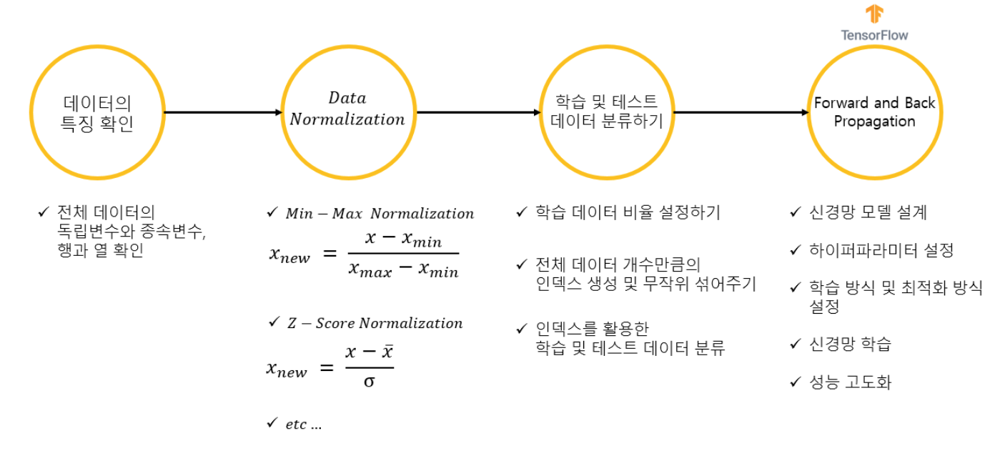

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import csv

In [ ]:
df = pd.read_csv('/content/pulsar_stars.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17898 entries, 0 to 17897
Data columns (total 9 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0    Mean of the integrated profile                17898 non-null  float64
 1    Standard deviation of the integrated profile  17898 non-null  float64
 2    Excess kurtosis of the integrated profile     17898 non-null  float64
 3    Skewness of the integrated profile            17898 non-null  float64
 4    Mean of the DM-SNR curve                      17898 non-null  float64
 5    Standard deviation of the DM-SNR curve        17898 non-null  float64
 6    Excess kurtosis of the DM-SNR curve           17898 non-null  float64
 7    Skewness of the DM-SNR curve                  17898 non-null  float64
 8   target_class                                   17898 non-null  int64  
dtypes: float64(8), int64(1)
memory usage: 1.2 MB


In [ ]:
df.describe()

,Mean of the integrated profile,Standard deviation of the integrated profile,Excess kurtosis of the integrated profile,Skewness of the integrated profile,Mean of the DM-SNR curve,Standard deviation of the DM-SNR curve,Excess kurtosis of the DM-SNR curve,Skewness of the DM-SNR curve,target_class
count,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000
mean,111.079968,46.549532,0.477857,1.770279,12.614400,26.326515,8.303556,104.857709,0.091574
std,25.652935,6.843189,1.064040,6.167913,29.472897,19.470572,4.506092,106.514540,0.288432
min,5.812500,24.772042,-1.876011,-1.791886,0.213211,7.370432,-3.139270,-1.976976,0.000000
25%,100.929688,42.376018,0.027098,-0.188572,1.923077,14.437332,5.781506,34.960504,0.000000
50%,115.078125,46.947479,0.223240,0.198710,2.801839,18.461316,8.433515,83.064556,0.000000
75%,127.085938,51.023202,0.473325,0.927783,5.464256,28.428104,10.702959,139.309331,0.000000
max,192.617188,98.778911,8.069522,68.101622,223.392140,110.642211,34.539844,1191.000837,1.000000


In [ ]:
print(df['target_class'].value_counts())

0    16259
1     1639
Name: target_class, dtype: int64


In [ ]:
with open('/content/pulsar_stars.csv') as csvfile:
    csvreader = csv.reader(csvfile)
    next(csvreader)
    rows = []

    for row in csvreader:
        rows.append(row)

data = np.asarray(rows, dtype='float32')

input_cnt, output_cnt = 8, 1

In [ ]:
data[:][0]

array([140.5625    ,  55.68378   ,  -0.23457141,  -0.6996484 ,
         3.1998327 ,  19.110426  ,   7.9755316 ,  74.242226  ,
         0.        ], dtype=float32)

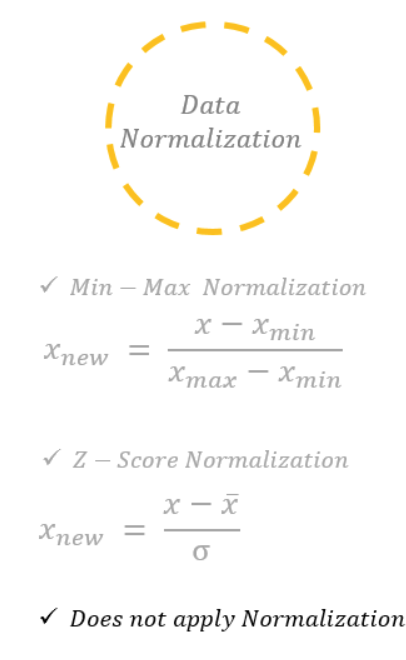

In [ ]:
train_ratio = 0.8
mb_size     = 32
test_begin_index = int(data.shape[0] * train_ratio)
print("test_begin_index : ", test_begin_index)

test_begin_index :  14318


In [ ]:
shuffle_map = np.arange(data.shape[0])
np.random.seed(1234)

np.random.shuffle(shuffle_map)
print(shuffle_map[:5])

[ 9375  1570 15443 14077  6079]


In [ ]:
train_data = data[shuffle_map[:test_begin_index]]
test_data  = data[shuffle_map[test_begin_index:]]

In [ ]:
train_x, train_y = train_data[: , : -output_cnt], train_data[: , -output_cnt : ] 
test_x, test_y   = test_data[: , : -output_cnt], test_data[: , -output_cnt : ]

print(train_x.shape)
print(train_y.shape)
print(test_x.shape)
print(test_y.shape)

(14318, 8)
(14318, 1)
(3580, 8)
(3580, 1)


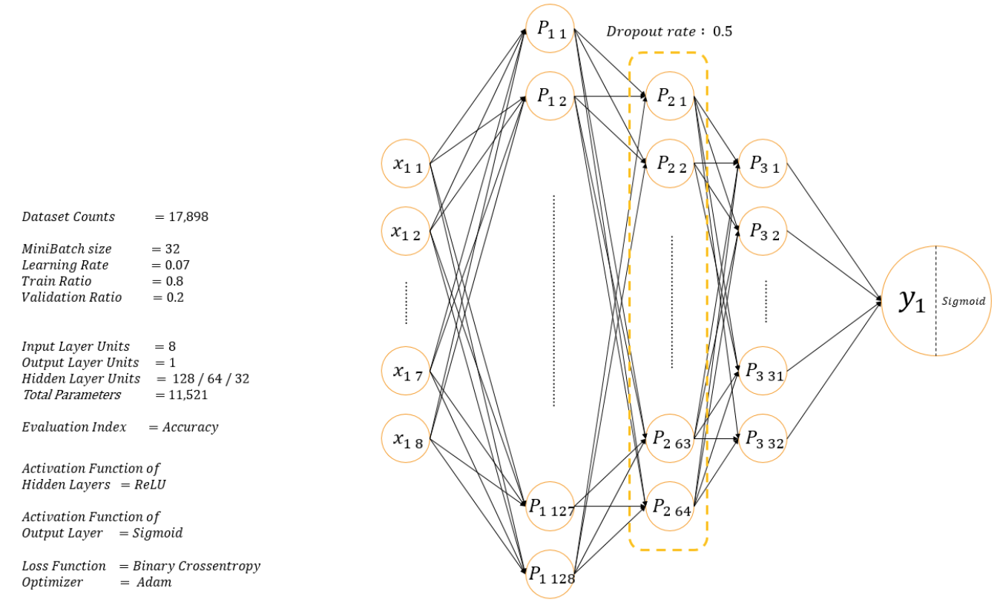

In [ ]:
pulsar_DNN_drop_sigmoid = tf.keras.Sequential([
                                               tf.keras.layers.Dense(units=128, activation='relu', input_shape = (8,)),
                                               tf.keras.layers.Dense(units=64, activation='relu'),
                                               tf.keras.layers.Dropout(rate = 0.5),
                                               tf.keras.layers.Dense(units=32, activation='relu'),
                                               tf.keras.layers.Dense(units=1, activation='sigmoid')
])

In [ ]:
pulsar_DNN_drop_sigmoid.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               1152      
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 33        
Total params: 11,521
Trainable params: 11,521
Non-trainable params: 0
_________________________________________________________________


In [ ]:
pulsar_DNN_drop_sigmoid.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                                loss = 'binary_crossentropy',
                                metrics = ['accuracy'])

In [ ]:
history = pulsar_DNN_drop_sigmoid.fit(train_x, train_y, 
                                      epochs = 15,
                                      batch_size = 32,
                                      validation_split = 0.2,
                                      callbacks = [tf.keras.callbacks.EarlyStopping(patience=3)])

Epoch 1/15
358/358 [==============================] - 2s 3ms/step - loss: 0.2527 - accuracy: 0.9426 - val_loss: 0.0794 - val_accuracy: 0.9770
Epoch 2/15
358/358 [==============================] - 1s 2ms/step - loss: 0.1298 - accuracy: 0.9642 - val_loss: 0.0781 - val_accuracy: 0.9784
Epoch 3/15
358/358 [==============================] - 1s 2ms/step - loss: 0.1219 - accuracy: 0.9675 - val_loss: 0.0846 - val_accuracy: 0.9801
Epoch 4/15
358/358 [==============================] - 1s 2ms/step - loss: 0.1167 - accuracy: 0.9694 - val_loss: 0.1036 - val_accuracy: 0.9787
Epoch 5/15
358/358 [==============================] - 1s 2ms/step - loss: 0.1149 - accuracy: 0.9682 - val_loss: 0.0868 - val_accuracy: 0.9745


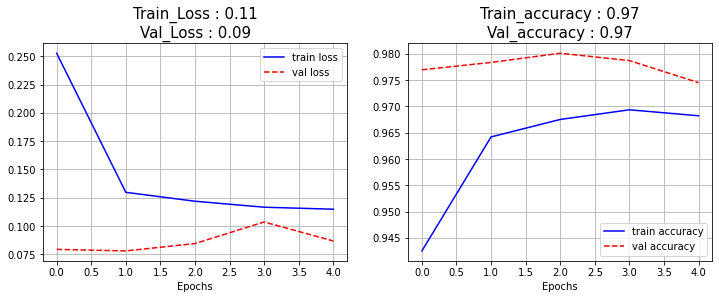

In [ ]:
val_accuracy = history.history['val_accuracy']
accuracy = history.history['accuracy']

val_loss = history.history['val_loss']
loss = history.history['loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)

plt.plot(history.history['loss'], 'b-', label = 'train loss')
plt.plot(history.history['val_loss'], 'r--', label = 'val loss')
plt.xlabel('Epochs')

plt.title("Train_Loss : {:.2f}\nVal_Loss : {:.2f}".\
          format(loss[-1], val_loss[-1]), fontsize = 15)

plt.legend()
plt.grid()

plt.subplot(1, 2, 2)

plt.plot(history.history['accuracy'], 'b-', label = 'train accuracy')
plt.plot(history.history['val_accuracy'], 'r--', label = 'val accuracy')
plt.xlabel('Epochs')

plt.title("Train_accuracy : {:.2f}\nVal_accuracy : {:.2f}".\
          format(accuracy[-1], val_accuracy[-1]), fontsize = 15)

plt.legend()
plt.grid()

plt.show()

In [ ]:
pred_Y = pulsar_DNN_drop_sigmoid.predict(test_x)
pred_Y_3 = np.round(pred_Y, 3)
print(pred_Y_3[:10])

pred_Y = np.round(pred_Y)
print(pred_Y[:10])

[[0.008]
 [0.01 ]
 [0.011]
 [0.007]
 [0.028]
 [0.036]
 [0.023]
 [0.028]
 [0.041]
 [0.045]]
[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]


In [ ]:
print(pd.DataFrame(pred_Y).value_counts())

print(pd.DataFrame(test_y).value_counts())

0.0    3352
1.0     228
dtype: int64
0.0    3258
1.0     322
dtype: int64


# 혼동행렬
# confusion matrix

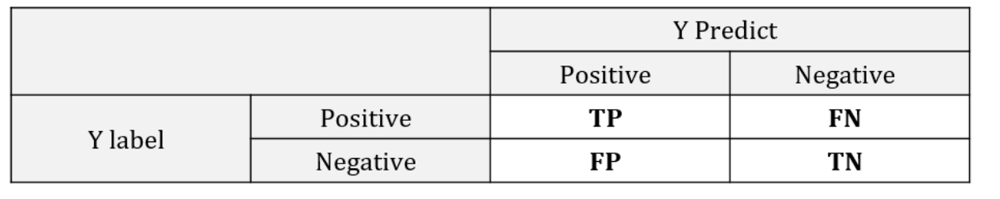

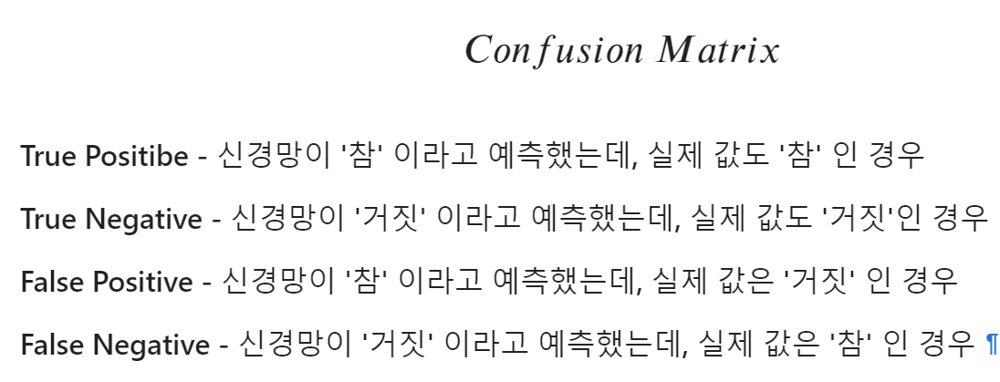

In [ ]:
# 주요 함수 
# np.greater(x1, x2)
# : 첫 번째 매개변수가 두 번째 매개변수 보다 크면 True를 반환합니다. 

# np.logical_and(x1, x2)
# : 첫 번째 매개변수와 두 번째 매개변수 모두 참(True)일시 True를 반환함 

# np.logical_not(x1)
# : 매개변수의 결과를 반대로 반환합니다.(True -> False)

In [ ]:
print(pred_Y_3)
result = np.greater(pred_Y_3, 0.5)
print(result)

In [ ]:
print(pred_Y_3[:5])
# 예측값(est)이 참(yes)이냐? 
# Y - Predict / Positive 
est_yes = np.greater(pred_Y, 0.5)
print("est_yes : \n", est_yes[:5])


# 실제값(ans)이 참(yes)이냐?
# Y label / Positive
ans_yes = np.greater(test_y, 0.5)
print("ans_yes : \n", ans_yes[:5])

# 예측값(est)이 거짓(no)이냐?
# Y - Predict / Negative
est_no = np.logical_not(est_yes)
print("est_no : \n", est_no[:5])

# 실제값(ans)이 거짓(no)이냐?
# Y label / Negative 
ans_no = np.logical_not(ans_yes)
print("ans_no : \n", ans_no[:5])


[[0.008]
 [0.01 ]
 [0.011]
 [0.007]
 [0.028]]
est_yes : 
 [[False]
 [False]
 [False]
 [False]
 [False]]
ans_yes : 
 [[False]
 [False]
 [False]
 [False]
 [False]]
est_no : 
 [[ True]
 [ True]
 [ True]
 [ True]
 [ True]]
ans_no : 
 [[ True]
 [ True]
 [ True]
 [ True]
 [ True]]


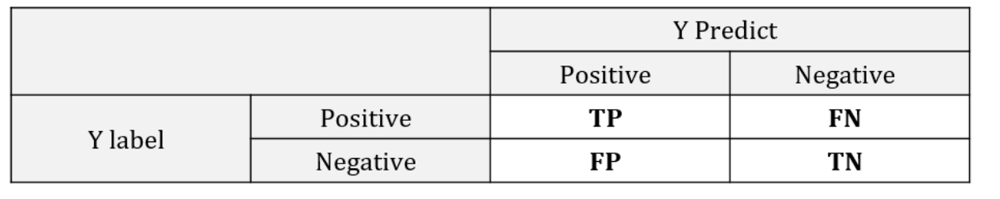

In [ ]:
tp = np.sum(np.logical_and(est_yes, ans_yes))
print("TP : ",tp)

tn = np.sum(np.logical_and(est_no,ans_no))
print("TN : ", tn)

fp = np.sum(np.logical_and(ans_no, est_yes))
print("FP : ", fp)

fn = np.sum(np.logical_and(ans_yes, est_no))
print("FN : ", fn)

TP :  219
TN :  3249
FP :  9
FN :  103


In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

In [ ]:
test_y[:, 0]
pred_Y[:, 0]

array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)

In [ ]:
print("confusion_matrix : \n", confusion_matrix(test_y[:, 0],pred_Y[:, 0]))
print("precision_score : \n", precision_score(test_y[:, 0],pred_Y[:, 0]))
print("recall_score : \n", recall_score(test_y[:, 0],pred_Y[:, 0]))

print("accuracy_score : \n", accuracy_score(test_y[:, 0],pred_Y[:, 0]))
print("f1_score : \n", f1_score(test_y[:, 0],pred_Y[:, 0]))

confusion_matrix : 
 [[3249    9]
 [ 103  219]]
precision_score : 
 0.9605263157894737
recall_score : 
 0.6801242236024845
accuracy_score : 
 0.9687150837988827
f1_score : 
 0.7963636363636364


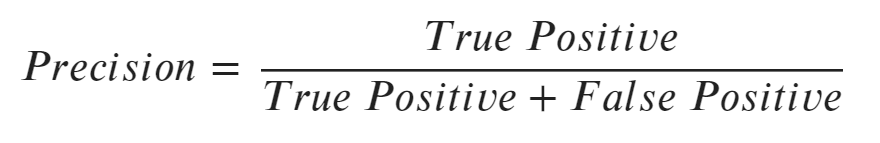

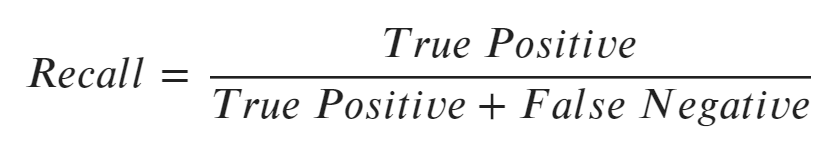

In [ ]:
precision = safe_div(tp , (tp + fp))
print("precision : ", precision)

recall = safe_div(tp , (tp + fn))
print("recall : ", recall)

accuracy = safe_div((tp + tn), (tp + tn + fp + fn))
print("accuracy : ", accuracy)

f1 = 2 * safe_div((precision * recall), (precision + recall))
print('f1 : ', f1)

precision :  0.9605263157894737
recall :  0.6801242236024845
accuracy :  0.9687150837988827
f1 :  0.7963636363636364


In [ ]:
def safe_div(p,q):
    p,q = float(p), float(q)

    if np.abs(q) < 1.0e-20:
        return np.sign(p)
        
    return p / q

In [ ]:
np.sign(-234)

-1

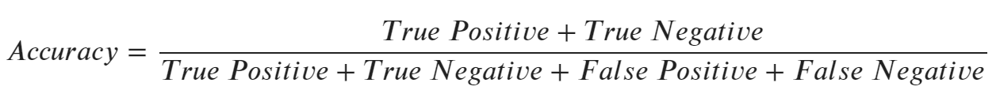

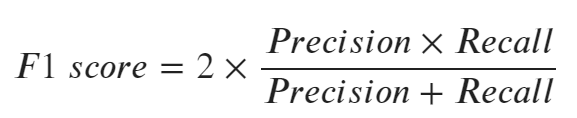

In [ ]:
accuracy = safe_div((tp + tn), (tp + tn + fp + fn))
print("accuracy : ", accuracy)

f1 = 2 * safe_div((precision * recall), (precision + recall))
print('f1 : ', f1)

accuracy :  0.9100558659217877
f1 :  0.0


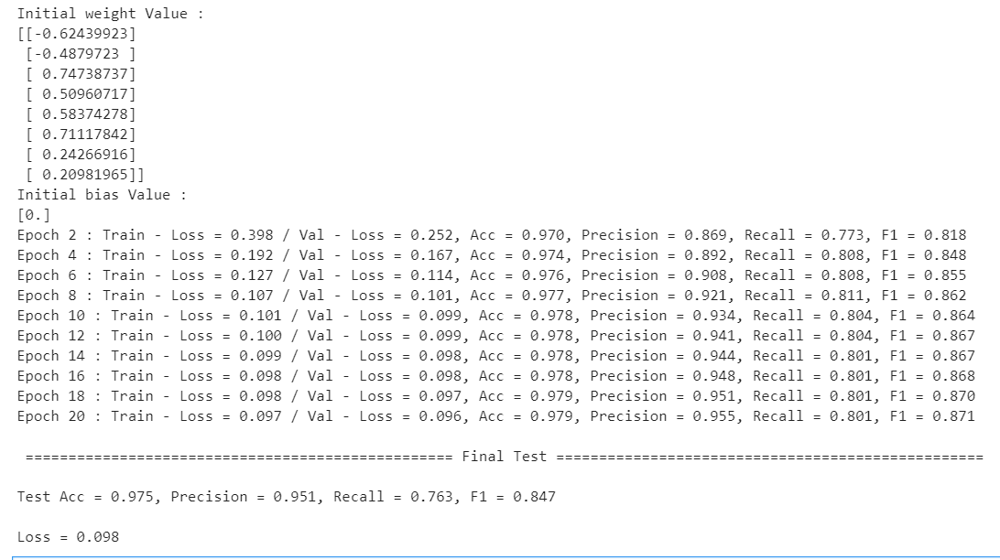

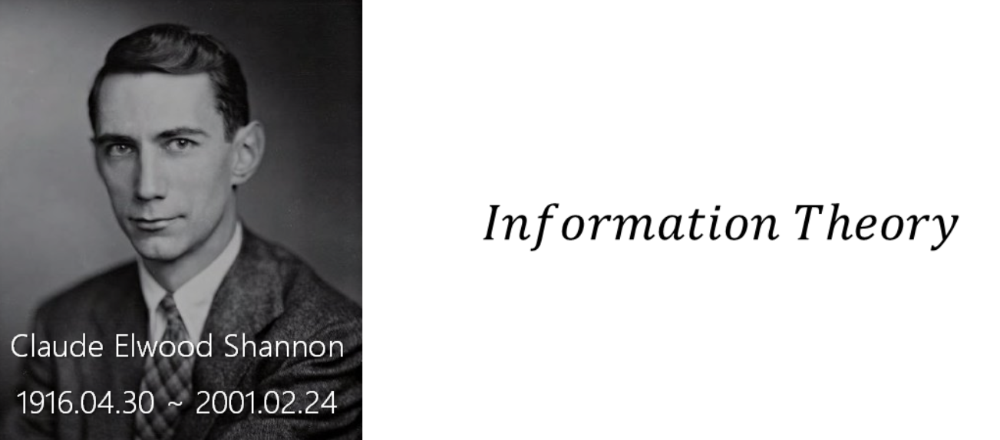

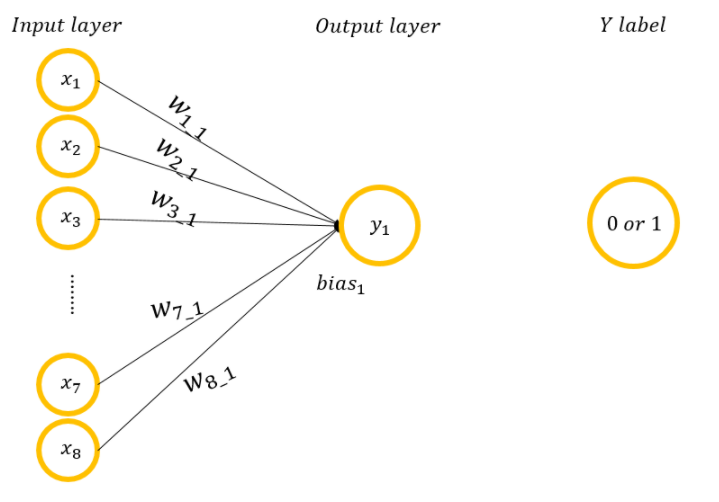

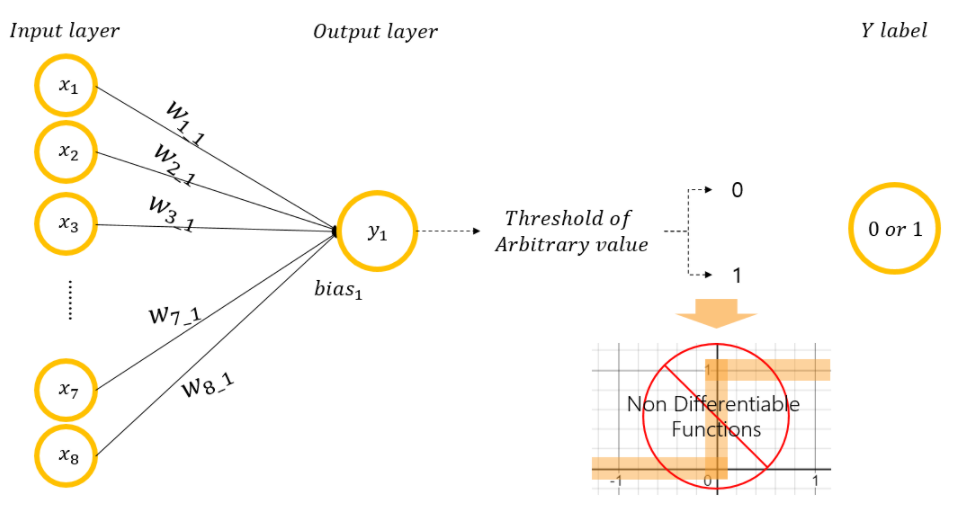

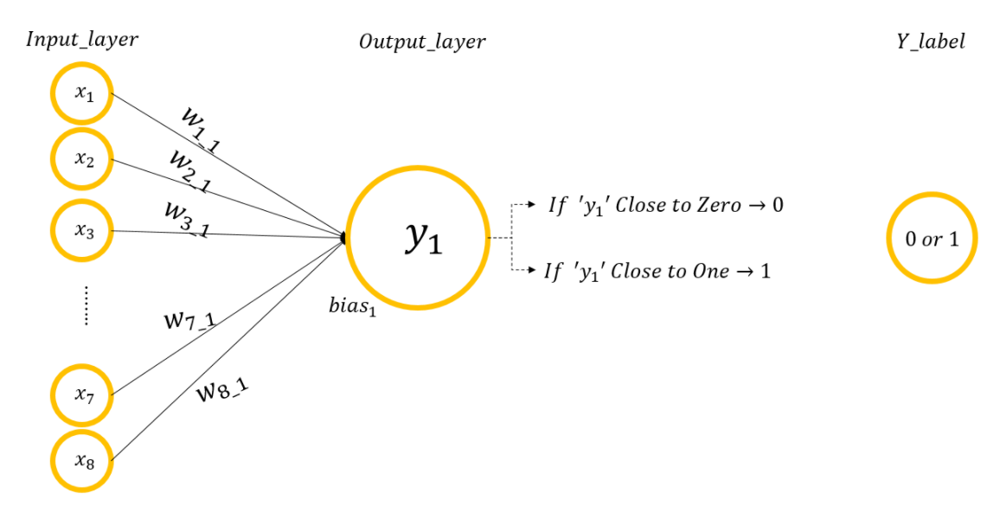

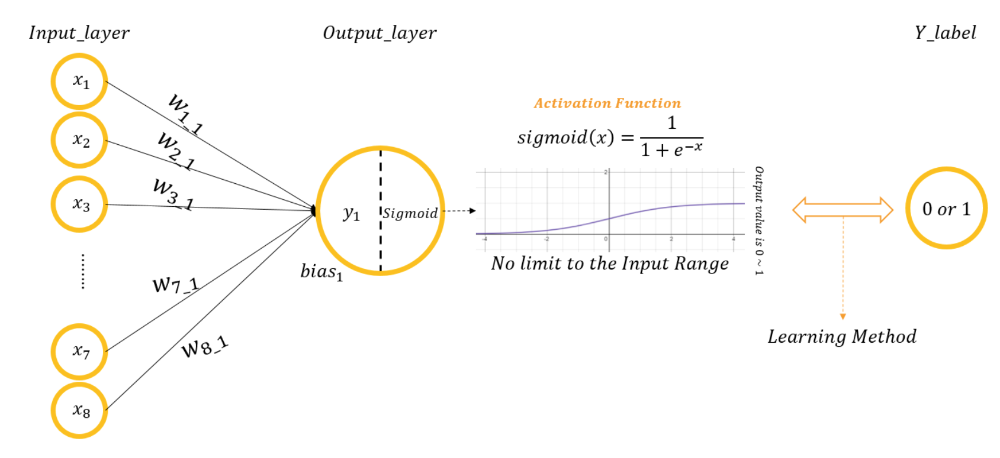

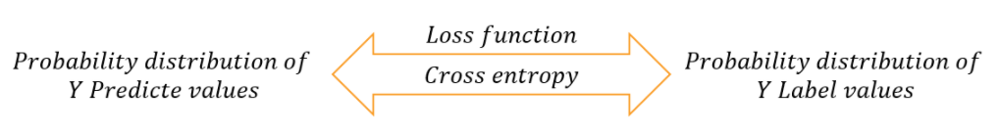

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


In [ ]:
x = np.arange(0,10,1)
e_rows = []

for i in x:
    e = np.exp(i)
    e_rows.append(e)

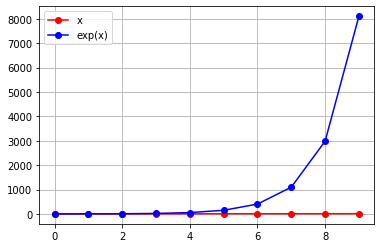

In [ ]:
plt.plot(x, '-o', color = 'red', label = 'x')
plt.plot(e_rows, '-o', color = 'blue', label = 'exp(x)')

plt.grid()
plt.legend()
plt.show()

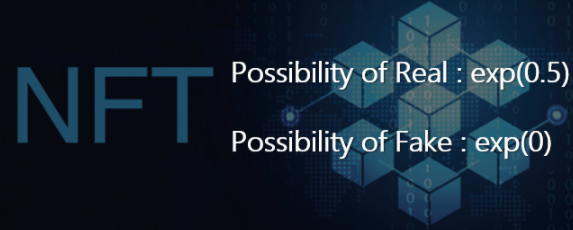

In [ ]:
def func_exp(x):
    return np.round(np.exp(x),3)

In [ ]:
A_real = func_exp(0.5)
A_fake = func_exp(0)

print("A_real : ", A_real)
print("A_fake : ", A_fake)

A_real :  1.649
A_fake :  1.0


# 비례상수(k)

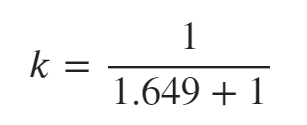

In [ ]:
k = 1 / (A_real + A_fake)

In [ ]:
print("A_real Prob : {:.3f}".format(A_real * k))
print("A_fake Prob : {:.3f}".format(A_fake * k))

A_real Prob : 0.622
A_fake Prob : 0.378


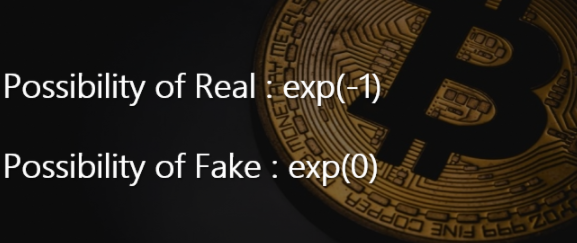

In [ ]:
A_real = func_exp(-1)
A_fake = func_exp(0)

print("A_real : ", A_real)
print("A_fake : ", A_fake)

A_real :  0.368
A_fake :  1.0


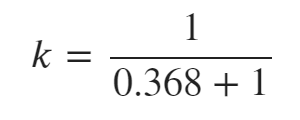

In [ ]:
k = 1 / (A_real + A_fake)

In [ ]:
print("A_real Prob : {:.3f}".format(A_real * k))
print("A_fake Prob : {:.3f}".format(A_fake * k))

A_real Prob : 0.269
A_fake Prob : 0.731


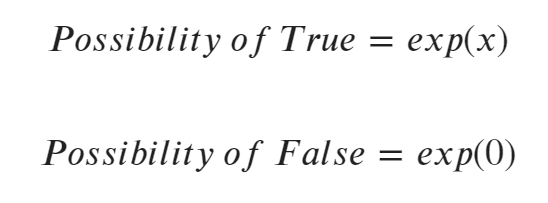

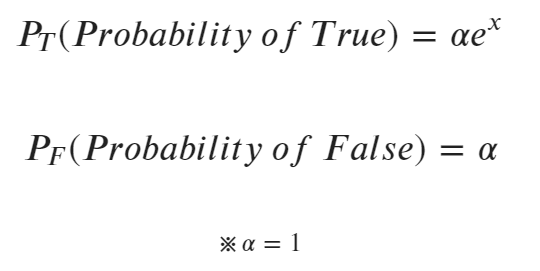

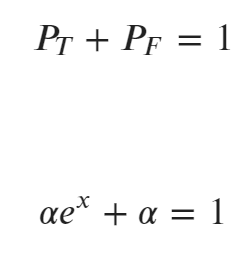

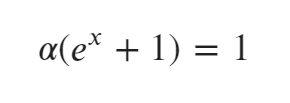

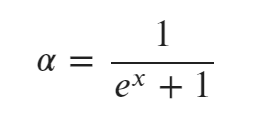

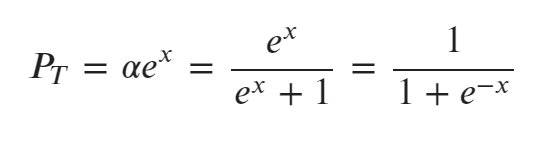

In [ ]:
def sigmoid(x):
    y_pred = 1 / (1 + np.exp(-x))
    return np.round(y_pred * 100, 3)

for x in range(-20, 20, 2):
    P_T = sigmoid(x)
    print("x value : {} -> {}".format(x, P_T)) 

x value : -20 -> 0.0
x value : -18 -> 0.0
x value : -16 -> 0.0
x value : -14 -> 0.0
x value : -12 -> 0.001
x value : -10 -> 0.005
x value : -8 -> 0.034
x value : -6 -> 0.247
x value : -4 -> 1.799
x value : -2 -> 11.92
x value : 0 -> 50.0
x value : 2 -> 88.08
x value : 4 -> 98.201
x value : 6 -> 99.753
x value : 8 -> 99.966
x value : 10 -> 99.995
x value : 12 -> 99.999
x value : 14 -> 100.0
x value : 16 -> 100.0
x value : 18 -> 100.0


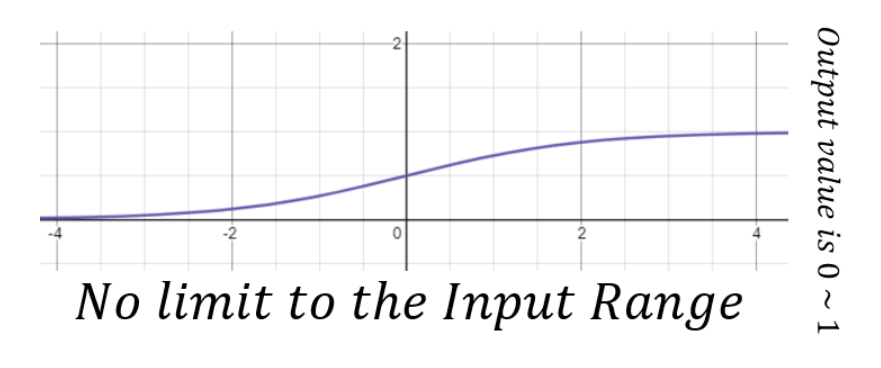

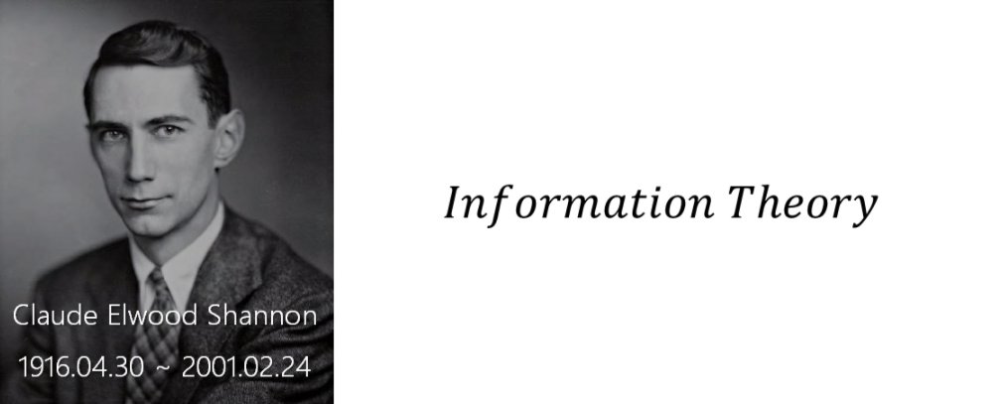

# '정보이론'은 신호에 존재하는 '정보의 양'을 측정하는 이론이다.

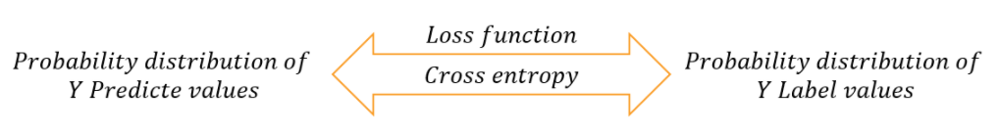

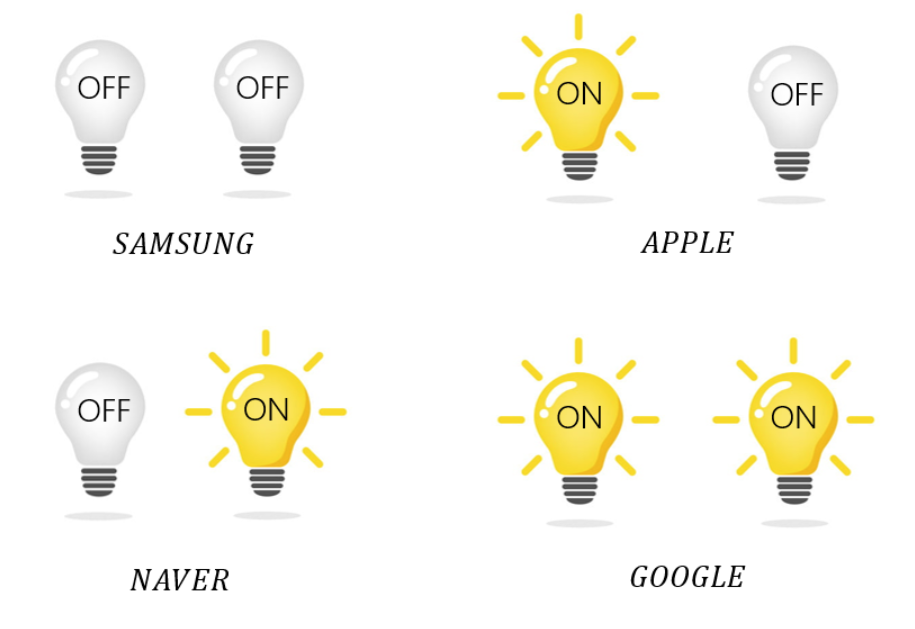

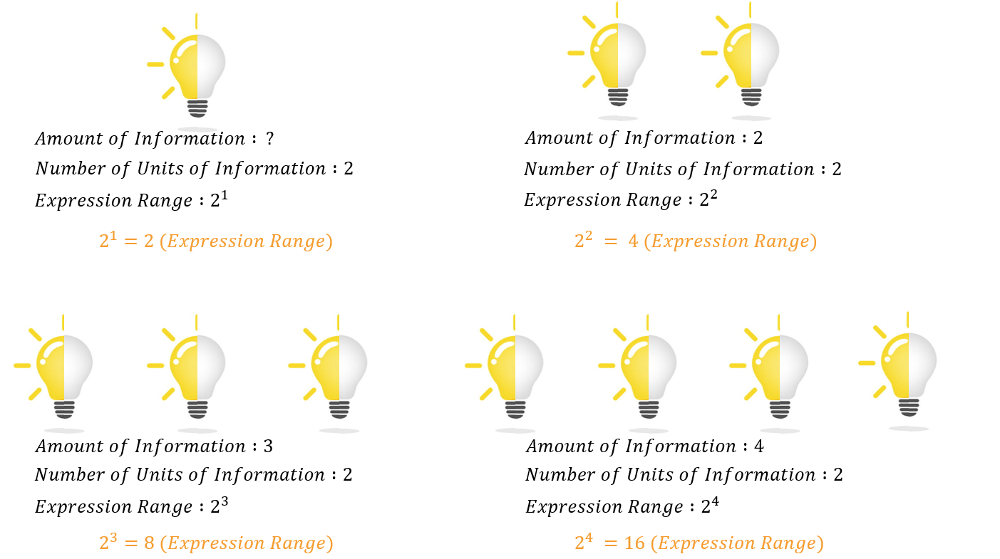

# 전구는 정보의 양(정보량)
# 단위 정보 수는 항상 2 
# 표현 범위를 알 수 있다.

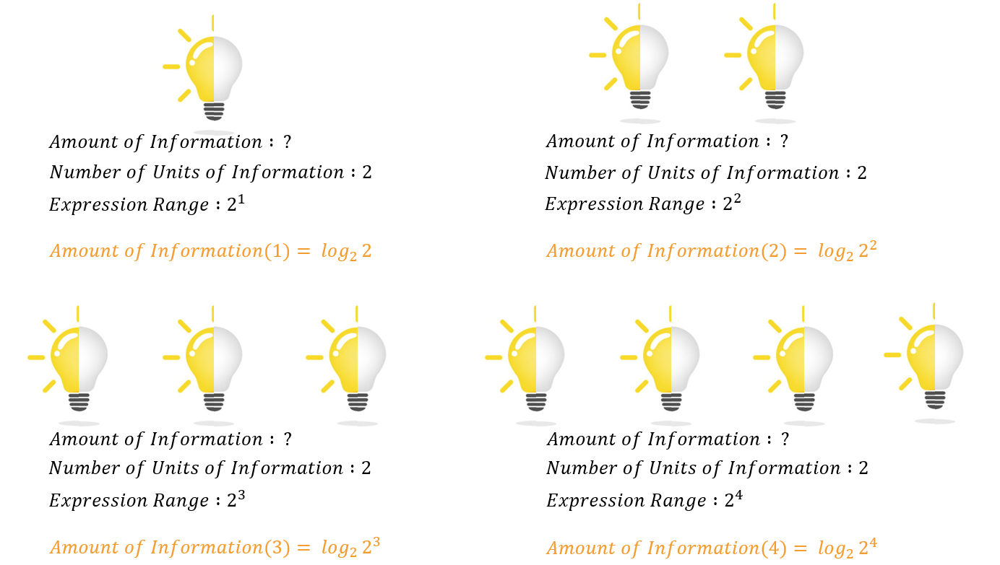

In [ ]:
import numpy as np

def amount_of_info(number_of_units_infomation, expression_range):
    if number_of_units_infomation == 2:
        amount_of_infomation = np.log2(expression_range)
    else:
        print("Check The Param(number_of_units_infomation)")

    return np.round(amount_of_infomation,3)

amount_of_infomation = amount_of_info(2, 64)

expression_range = [2, 4, 8, 16, 32]

for i in expression_range:
    amount_of_infomation = amount_of_info(2, i)
    print("Amount_of_infomation : ", amount_of_infomation)

Amount_of_infomation :  1.0
Amount_of_infomation :  2.0
Amount_of_infomation :  3.0
Amount_of_infomation :  4.0
Amount_of_infomation :  5.0


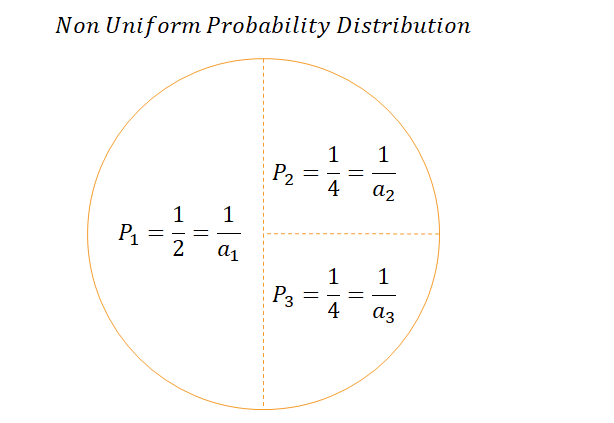

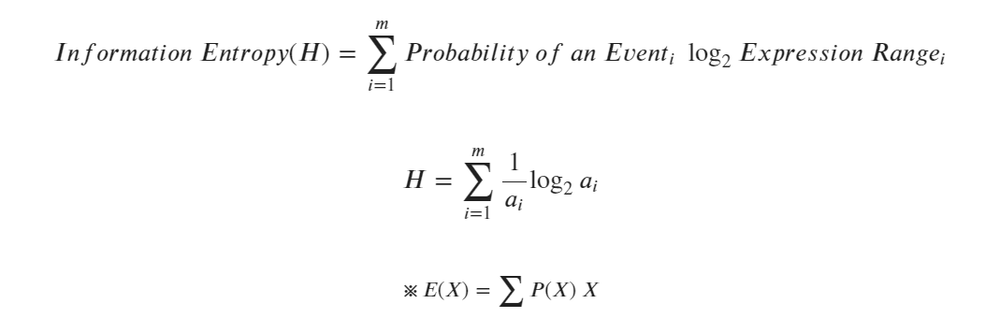

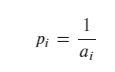

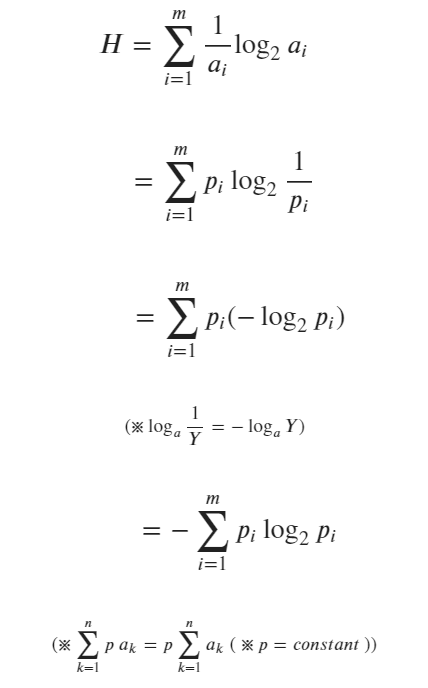

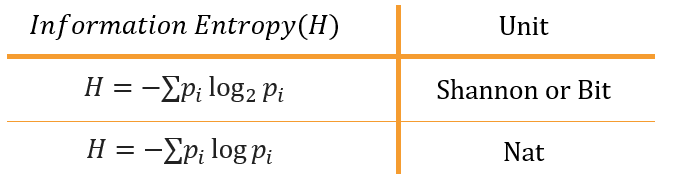

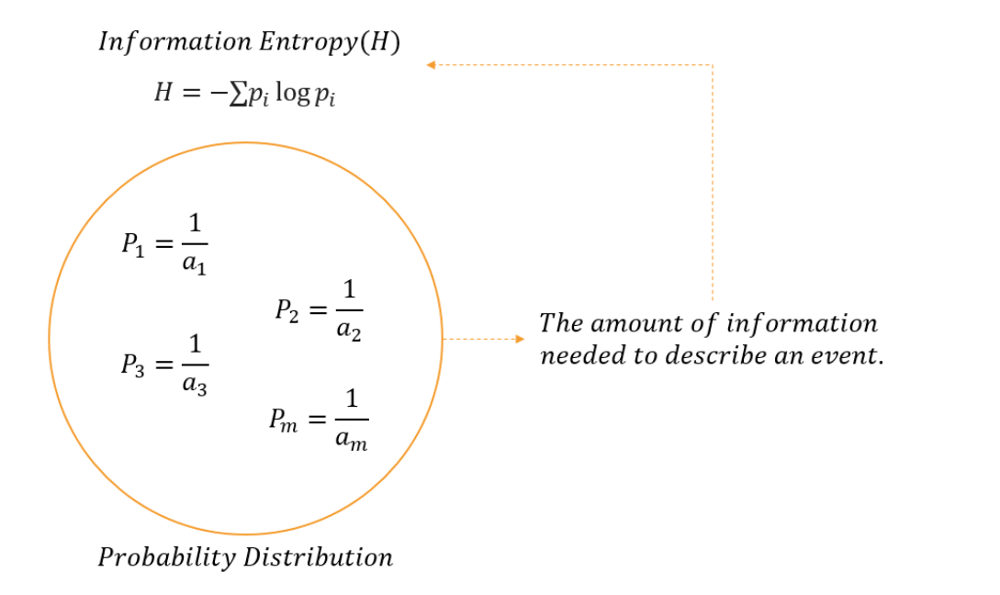

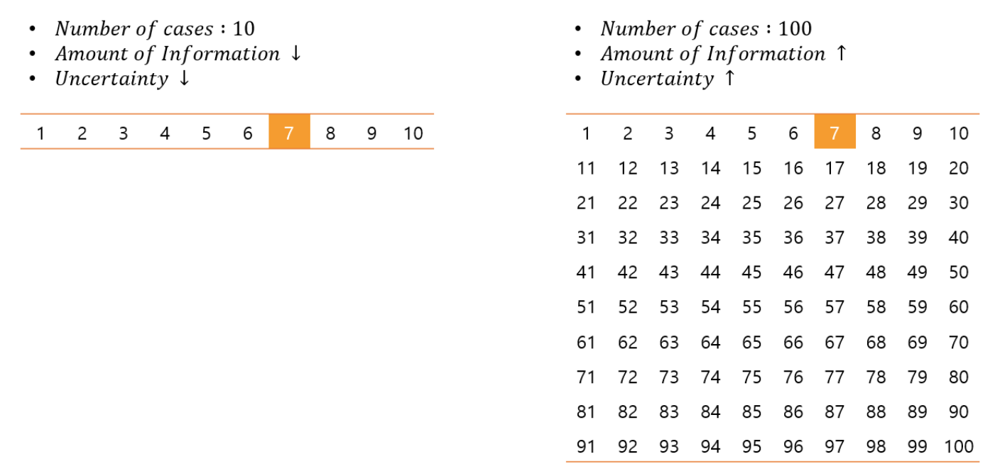

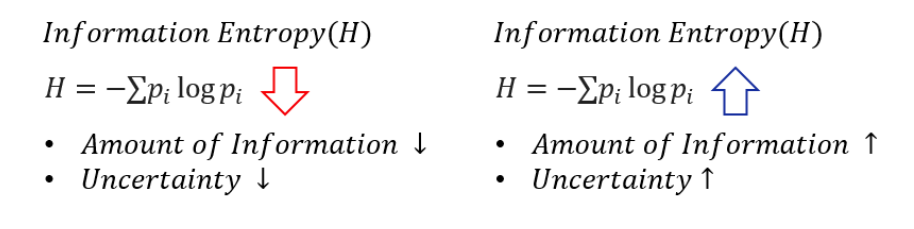

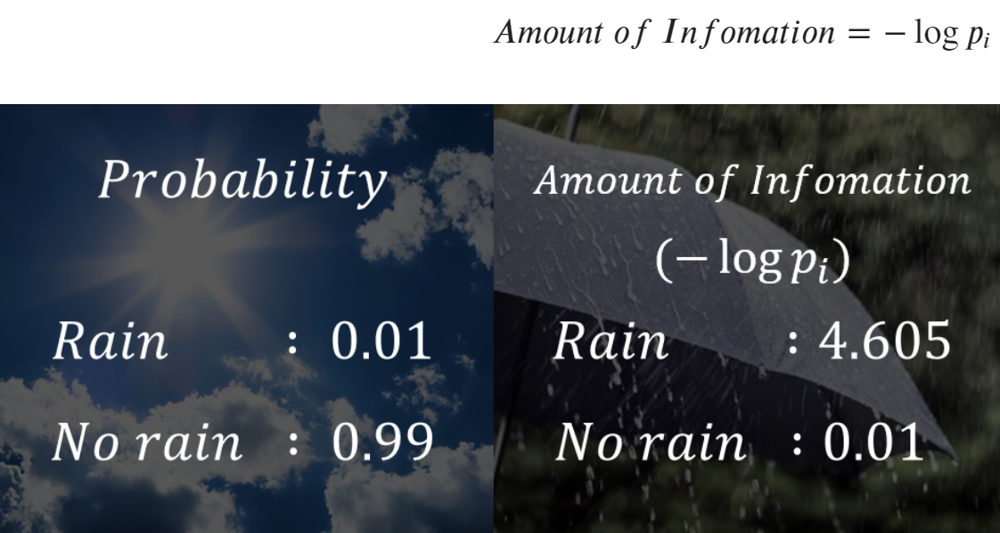

In [ ]:
rain_probility     = 0.01
no_rain_probility  = 0.99

def amount_of_infomation(prob):
    amount_of_info = -np.log(prob)
    return np.round(amount_of_info,3)

H_1 = amount_of_infomation(rain_probility)
H_2 = amount_of_infomation(no_rain_probility)

print("Rain_prob_amount_of_info : ", H_1)
print("No_Rain_prob_amount_of_info : ", H_2)

Rain_prob_amount_of_info :  4.605
No_Rain_prob_amount_of_info :  0.01


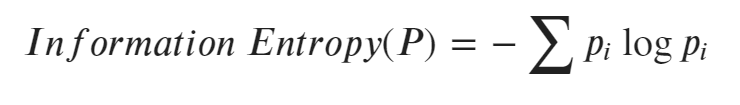

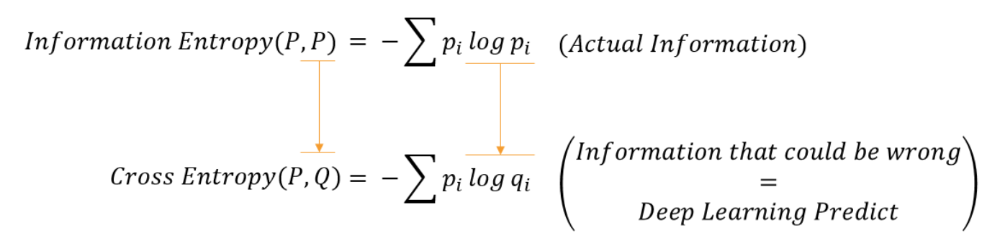

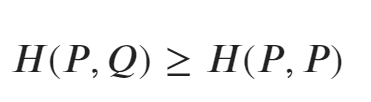

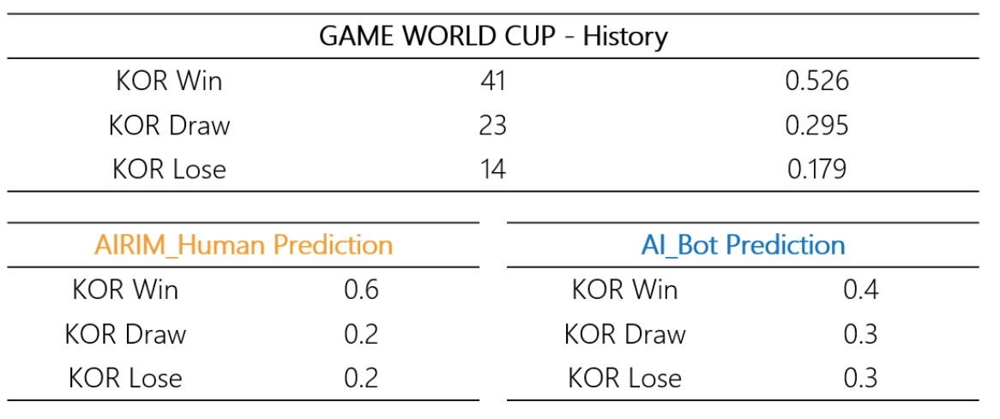

In [1]:
import numpy as np

Real_Prob  = np.array([0.526, 0.295, 0.179])
Human_Prob = np.array([0.6, 0.2, 0.2]) 
AI_Prob    = np.array([0.4, 0.3, 0.3])

In [2]:
class Entropy():
    def __init__(self, Prob, Q):
        self.Prob = Prob
        self.Q    = Q

In [4]:
def out_entropy(self, H_Q = True):
    global cross_entropy, info_entropy

    amount_of_info_row = []

    if H_Q == True:  # 교차 엔트로피 
        for i in range(len(self.Q)):
            amount_of_info = - self.Prob[i] * np.log(self.Q[i])
            amount_of_info_row.append(amount_of_info)
        
        cross_entropy = np.sum(amount_of_info_row)
        print('---- Cross Entropy ----')

        return np.round(cross_entropy, 3)

    else:            # 정보 엔트로피
        for p in self.Prob:
            amount_of_info = -p * np.log(p)
            amount_of_info_row.append(amount_of_info)
        
        info_entropy = np.sum(amount_of_info_row)
        print('---- Infomation Entropy ----')

        return np.round(info_entropy, 3)

Entropy.entropy = out_entropy

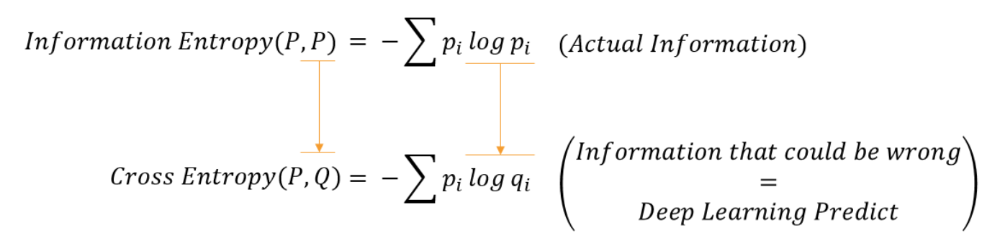

In [5]:
class_entropy_1 = Entropy(Real_Prob, Human_Prob)

In [6]:
Human_info_entropy = class_entropy_1.entropy(H_Q = False)
print(Human_info_entropy)

Human_cross_entropy = class_entropy_1.entropy(H_Q = True)
print(Human_cross_entropy)

---- Infomation Entropy ----
1.006
---- Cross Entropy ----
1.032


In [7]:
class_entropy_2 = Entropy(Real_Prob, AI_Prob)

In [8]:
AI_info_entropy = class_entropy_2.entropy(H_Q = False)
print(AI_info_entropy)

AI_cross_entropy = class_entropy_2.entropy(H_Q = True)
print(AI_cross_entropy)

---- Infomation Entropy ----
1.006
---- Cross Entropy ----
1.053


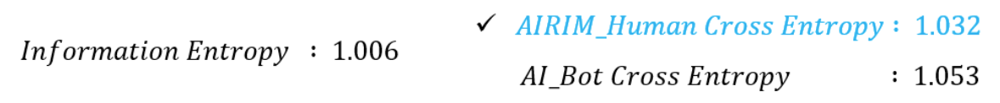

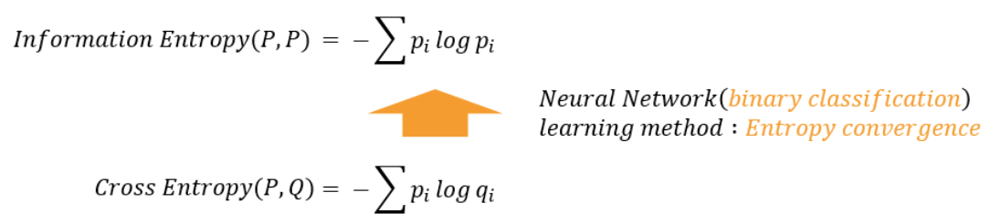

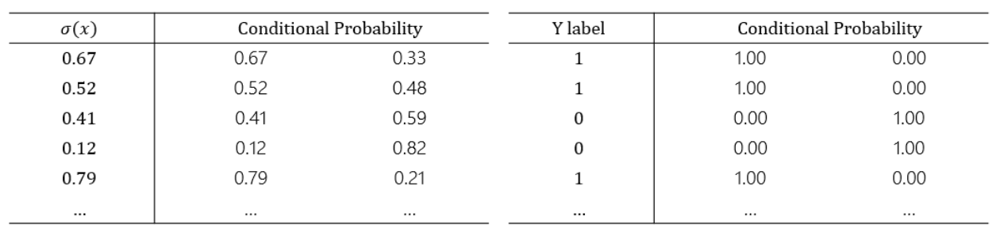

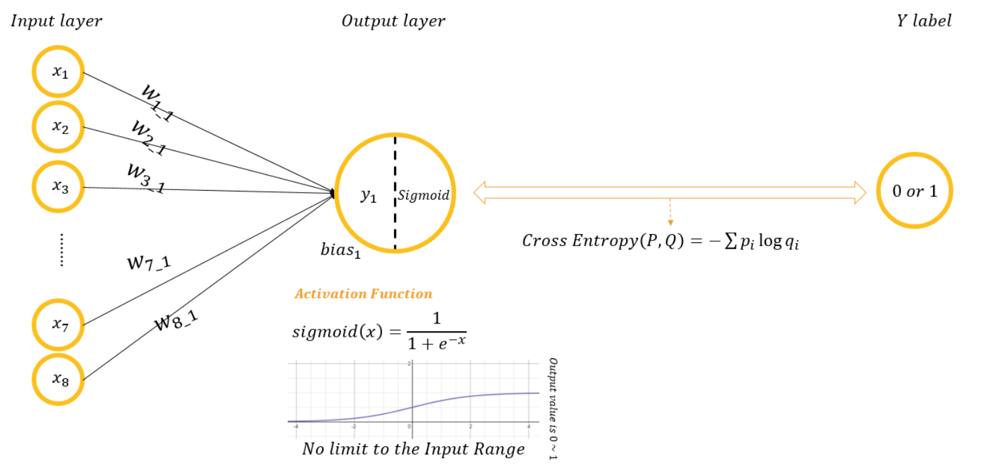

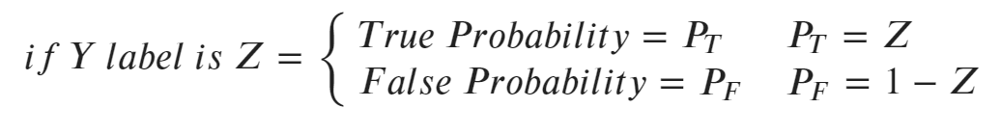

...

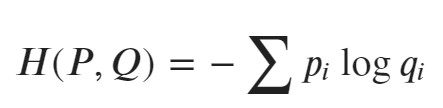

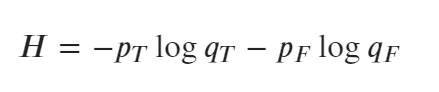

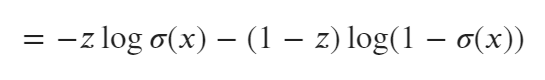

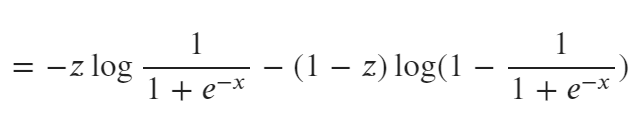

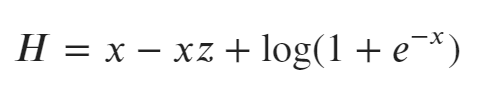

## 이 식의 정리 과정은 다음과 같습니다. 

## $$ H = -z \log \frac{1}{1+e^{-x}} - (1-z)\log (1-\frac{1}{1+e^{-x}}) $$

## $$ = -z \log \frac{1}{1+e^{-x}} - (1-z)\log(\frac{e^{-x}}{1+e^{-x}}) $$ 
#### $$ (※ \log{a} \frac{X}{Y} = \log{a} \ X - \log{a} \ Y )$$

## $$ \qquad \qquad = z\log (1+ e^{-x}) - (1 - z)(\log e^{-x} - \log(1 + e^{-x})) $$  

## $$ \qquad \qquad \qquad \; \; = z \log(1 + e^{-x})-(1-z)\log e^{-x} + (1 - z)\log(1+e^{-x})$$
## $$※ like \ terms$$
## $$ \quad = (z + 1 - z)\log(1+e^{-x}) - (1-z)\log e^{-x}$$
## $$ = (z+1-z)\log(1+e^{-z}) - (1-z)(-x) $$
### $$ (※ \log_{a}{X^{p}} = p \log_a X) $$
## $$ = x-xz + \log(1+e^{-x}) \! \qquad \qquad \qquad \quad$$

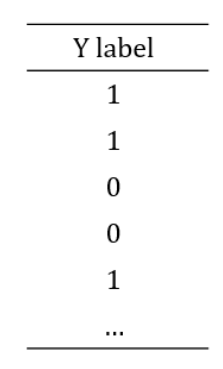

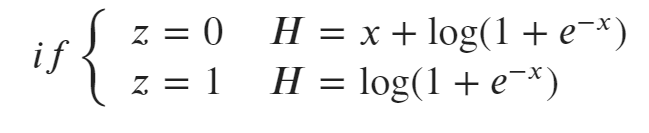

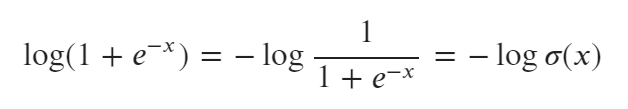

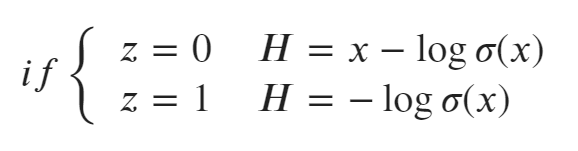

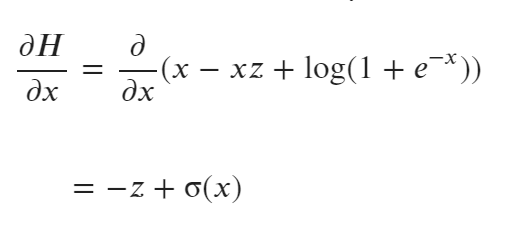

## $$ \frac{∂H}{∂x} = \; \frac{∂}{∂x}(x - xz + \log(1 + e^{-x}))$$ 

## $$  = 1 - z + \frac{(1+e^{-x})'}{1+e^{-x}} \! \quad \;$$ 
#### $$ (※ y = \log_{e} f(x)  \Rightarrow y' = \frac{f'(x)}{f(x)}) $$
## $$  = 1 - z + \frac{-e^{-x}}{1+e^{-x}} \! \qquad  $$ 

## $$ ※ \begin{cases}(e^{-x})' = -e^{-x} \\(e^{x})' = e^{x})\end{cases} $$

## $$ = -z + 1 + \frac{-e^{-x}}{1+e^{-x}} \! \quad \;$$
## $$ \quad \quad  = -z + \frac{1+e^{-x}}{1+e^{-x}} + \frac{-e^{-x}}{1+e^{-x}} $$
## $$ \quad \; \; = -z + \frac{1+e^{-x} + (-e^{-x})} {1+e^{-x}}$$
## $$ = -z + \frac{1}{1+e^{-x}} \qquad \; \; $$
## $$ = -z + σ(x) \! \qquad \qquad \; $$

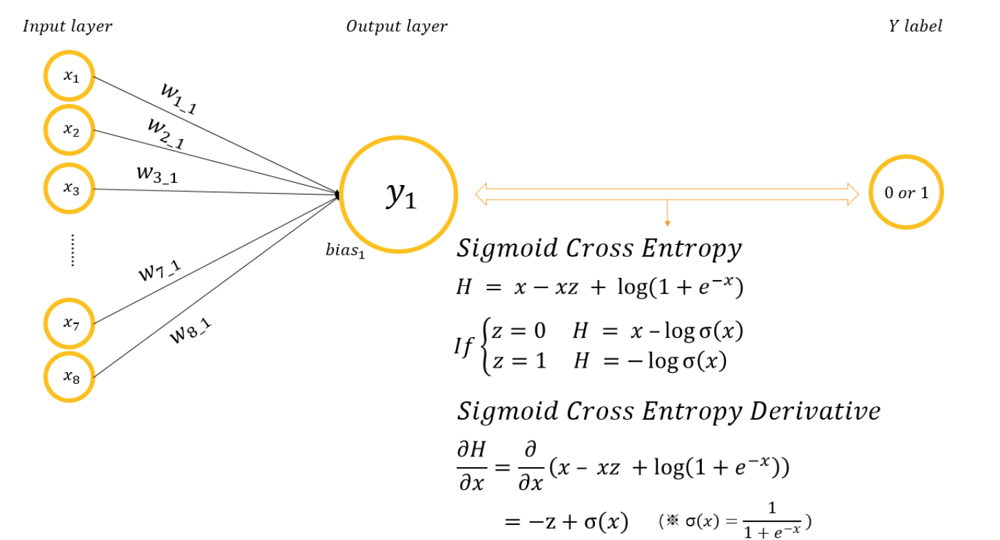

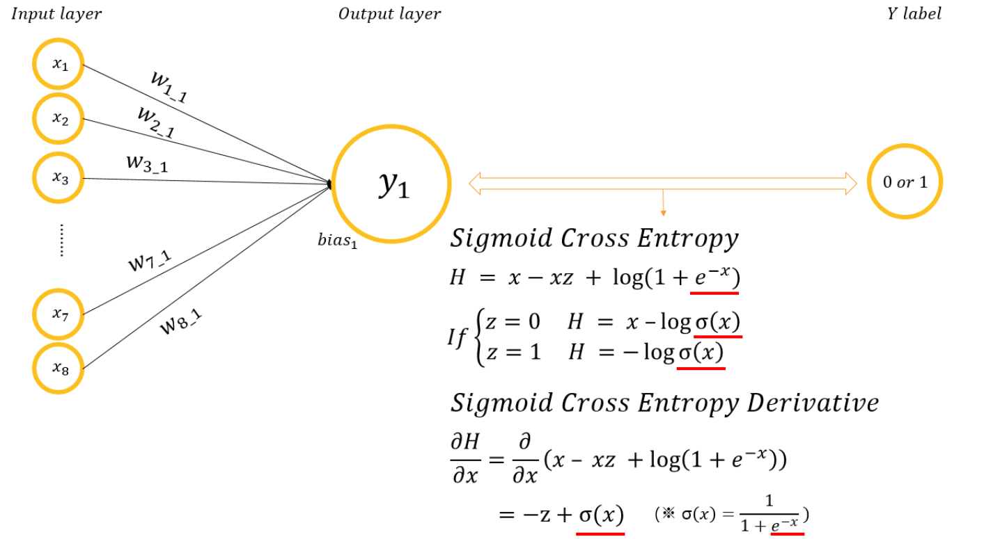

In [9]:
def sigmoid_A(x):
    y = 1 / (1 + np.exp(-x))
    print(y)

In [11]:
sigmoid_A(-1000)
#sigmoid_A(1000)
#sigmoid_A(0)

0.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


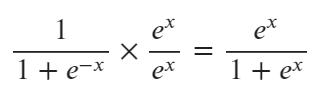

In [12]:
def sigmoid_B(x):
    y = np.exp(x) / (1.0 + np.exp(x))
    print(y)

In [15]:
sigmoid_B(1000)
#sigmoid_B(-1000)
#sigmoid_B(0)

nan


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in double_scalars
  


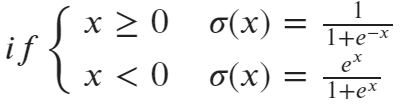

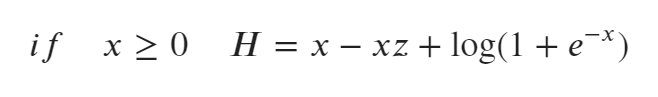

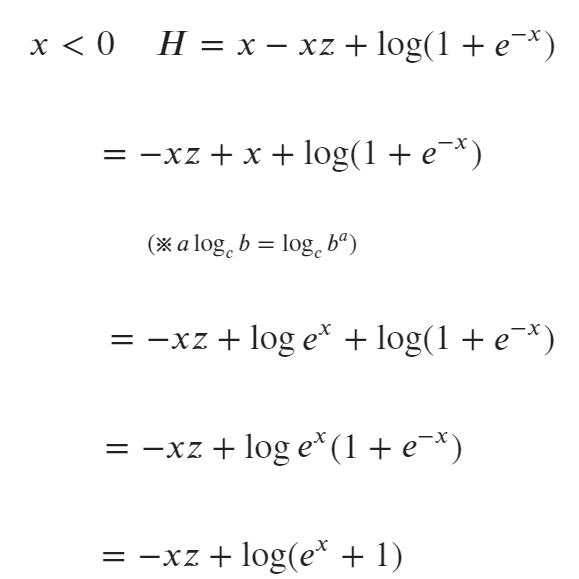

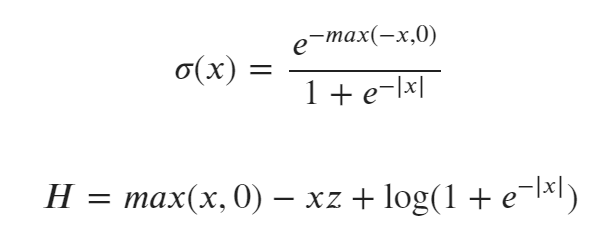

In [20]:
def relu(x):
    return np.maximum(x, 0)

def sigmoid_C(x):
    y = np.exp(-relu(-x)) / (1.0 + np.exp(-np.abs(x)))
    print(y)

In [21]:
x_list = [1000, -1000, 0]

for x in x_list:
    sigmoid_A(x)

1.0
0.0
0.5


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


In [22]:
for x in x_list:
    sigmoid_B(x)

nan
0.0
0.5


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in double_scalars
  


In [23]:
for x in x_list:
    sigmoid_C(x)

1.0
0.0
0.5


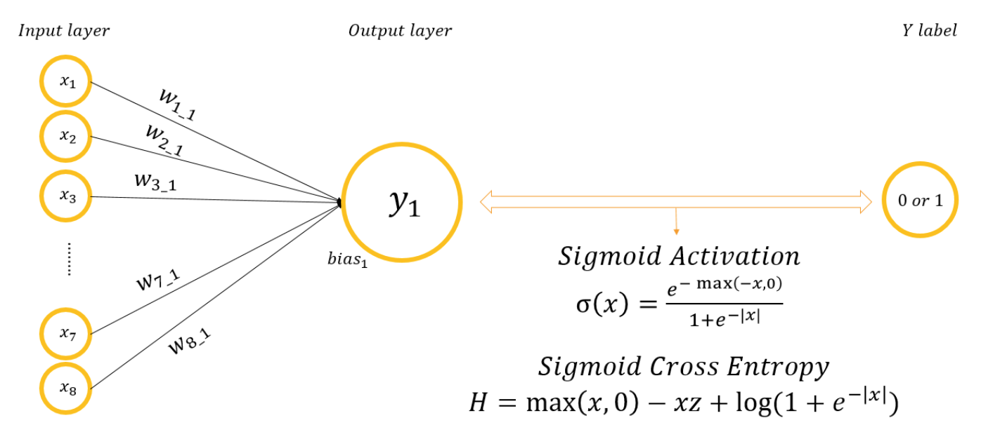

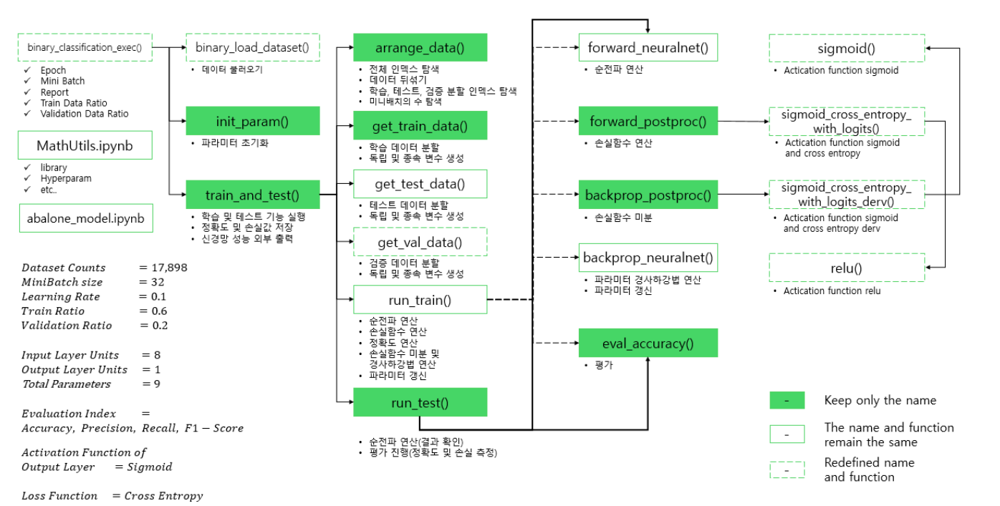